# Thesis Topic: Improving an Understanding of Machine Learning predictions through maps

### The Problem
- Global ML feature importance metrics are insufficient for local Interpretability ([Hu et al., 2020](https://www.semanticscholar.org/paper/eb51256d2f7c66d256be3e51e24a781dc7efe980
); [Aditya & Pal, 2022](https://doi.org/10.48550/ARXIV.2210.04533))
- A non-interpretable ML prediction leads to poor trust and transparency ([Gartner, 2023](https://doi.org/10.32909/kg.21.si.4); [Robinson et al., 2023](https://doi.org/10.1145/3615886.3627734))
- There is literature gap on how to communicate ML model local interpretability using maps.

### Research Objectives
1. To review existing EML tools for understanding ML predictions.
2. To propose a local interpretability workflow integrated with maps.
3. To implement the proposed workflow using a case study.

### Research Questions
1. How effective are existing tools in the local interpretability of ML models?
2. How can cartography support the workflow for understanding the local interpretability of ML predictions?
3. What are the technical steps and challenges in implementing the proposed workflow?


### Potential Users
- Soil Scientists, Fertilizer Researchers, Agronomists, Decision Makers, General Map Users

Author:  By Isaac Newton Kissiedu, International M.Sc. Cartography Student, TU Dresden, Germany

### Study Area and Methodology
<img src="./Study_Area_Map.png" alt="image" width="800" height="500">
<img src="./Methodology.png" alt="image" width="800" height="500">

### Import Packages

In [1]:
%%time

# Core python
import os
import pickle
import math

# Data
import rioxarray as rxr
from pyogrio import read_dataframe
import pandas as pd
import numpy as np

# Plotting
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import plotly.express as px

# Machine Learning
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.base import clone
from quantile_forest import RandomForestQuantileRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

# Explainable AI
import shap
import fasttreeshap
shap.initjs()

# Program
from CartoXAI import m_01_data_prep as data_prep
from CartoXAI import m_02_exploratory_da as explore
from CartoXAI import m_03_preprocess as preprocess
from CartoXAI import m_04_ml_process as ml_process
from CartoXAI import m_05_xai as xai

CPU times: total: 3.92 s
Wall time: 4.84 s


### Data Preparation

In [2]:
%%time

# Total Nitrogen Observations
obs = data_prep.prepare_obs_data(in_gee_csv_dir= "data/GEE Covariates/obs",
                                in_file_obs= "data/isric_total_N.gpkg",
                                target_col= "nitkjd_value_avg",
                                pk_col= "pk",
                                out_file_gpkg= "saved/data/obs_merged_covs_utmz30n.gpkg",
                                out_gpkg_lyr_name= "total_N", target_epsg=32630)

# 1km Grid
grid1km = data_prep.prepare_grid_data(in_gee_csv_dir= "data/GEE Covariates/grid",
                                  in_file_grid= "data/GEE Covariates/grid/shp_to_gee/grid.shp",
                                  out_file_gpkg= "saved/data/grid1km_merged_covs_utmz30n.gpkg",
                                  out_gpkg_lyr_name= "grid", target_epsg=32630)

Reprojecting the observation points to EPSG:32630
Reprojecting the grid points to EPSG:32630
CPU times: total: 1min 34s
Wall time: 1min 36s


### Preview data

observation data


,pk,nitkjd_value_avg,geometry,SRTM_Aspect,SRTM_Eastness,SRTM_Elevation,SRTM_GaussianCurvature,SRTM_Hillshade,SRTM_HorizontalCurvature,SRTM_MaximalCurvature,...,BIO9ALT,BIO12ALT,BIO13ALT,BIO14ALT,BIO15ALT,BIO16ALT,BIO17ALT,BIO18ALT,BIO19ALT,BIO3ALT
0,1,0.36,POINT (268386.521 1168851.079),94.772605,0.996533,299.743532,1.830000e-08,0.999987,-0.000141,-0.000076,...,26.3,1093.0,285.0,2.0,98.0,680.0,11.0,187.0,680.0,63.0
1,2,0.44,POINT (282865.898 1150317.052),285.623279,-0.963053,329.515390,1.910000e-08,0.999823,0.000128,0.000156,...,26.6,1138.0,290.0,2.0,96.0,695.0,13.0,203.0,695.0,65.0
2,3,0.26,POINT (290111.590 1141053.530),188.968174,-0.155886,310.898924,1.900000e-08,0.999626,-0.000108,-0.000108,...,26.8,1167.0,290.0,2.0,93.0,698.0,14.0,215.0,698.0,65.0
3,4,0.32,POINT (291867.092 1179766.565),32.345325,0.535021,302.960668,-2.970000e-10,0.999753,0.000073,0.000074,...,26.2,1077.0,282.0,1.0,100.0,676.0,8.0,182.0,14.0,63.0
4,5,0.22,POINT (291867.092 1179766.565),32.345325,0.535021,302.960668,-2.970000e-10,0.999753,0.000073,0.000074,...,26.2,1077.0,282.0,1.0,100.0,676.0,8.0,182.0,14.0,63.0



grid data


,fid,pk,geometry,SRTM_Aspect,SRTM_Eastness,SRTM_Elevation,SRTM_GaussianCurvature,SRTM_Hillshade,SRTM_HorizontalCurvature,SRTM_MaximalCurvature,...,BIO9ALT,BIO12ALT,BIO13ALT,BIO14ALT,BIO15ALT,BIO16ALT,BIO17ALT,BIO18ALT,BIO19ALT,BIO3ALT
0,1,1,POINT (745227.859 1668034.081),0.236251,0.004123,168.297792,-8.970000e-06,0.586693,0.000131,0.001007,...,25.5,323.0,118.0,0.0,144.0,264.0,0.0,49.0,0.0,56.0
1,2,2,POINT (746227.859 1668034.082),359.885275,-0.002002,212.246695,3.620000e-07,0.467907,0.000010,0.001408,...,25.5,323.0,118.0,0.0,144.0,264.0,0.0,49.0,0.0,56.0
2,3,3,POINT (747227.859 1668034.081),0.262393,0.004580,210.988476,-3.680000e-06,0.468140,-0.000106,0.002839,...,25.5,323.0,118.0,0.0,144.0,264.0,0.0,49.0,0.0,56.0
3,4,4,POINT (748227.859 1668034.081),359.909342,-0.001582,212.514421,-5.710000e-07,0.466770,-0.000016,0.001932,...,25.5,322.0,117.0,0.0,143.0,263.0,0.0,49.0,0.0,56.0
4,5,5,POINT (749227.859 1668034.081),359.858277,-0.002474,243.589338,-1.220000e-06,0.658715,-0.000047,0.005007,...,25.5,321.0,117.0,0.0,143.0,262.0,0.0,49.0,0.0,56.0


CPU times: total: 13 s
Wall time: 13.1 s


<Axes: title={'center': 'Grid'}>

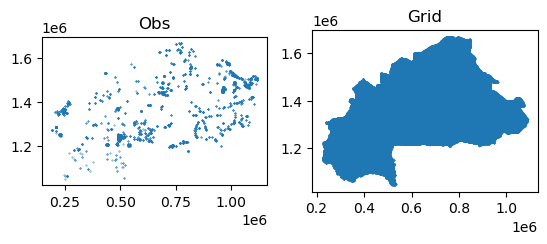

In [3]:
%%time

print("observation data with extracted covariates")
display(obs.head())

print("\ngrid data with extracted covariates")
display(grid1km.head())

fig, (ax1, ax2) = plt.subplots(1, 2)
ax1.set_title('Obs')
ax2.set_title('Grid')
obs.plot(ax=ax1, markersize=0.1)
grid1km.plot(ax=ax2, markersize=0.1)

### Exploratory Data Analysis - Load Data (We can start running from here once data preparation has been done)

In [4]:
%%time

# Data paths

in_file_obs = 'saved/data/obs_merged_covs_utmz30n.gpkg'
in_file_grid = 'saved/data/grid1km_merged_covs_utmz30n.gpkg'

# Load datasets
obs, grid1km = explore.load_data(in_file_obs, in_file_grid, obs_layer_name= "total_N",grid_layer_name= "grid")


# Review columns and select candidate features
obs.columns

# Select primary key column
key_column = "pk"

# Select target feature
target = "nitkjd_value_avg"

# Select ML candidate features
features = [f for f in obs.columns if f not in ["pk","fid","geometry","nitkjd_value_avg","nitkjd_date"]]

Loaded data from raw files
CPU times: total: 39.1 s
Wall time: 39.1 s


### Exploratory Data Analysis - Run EDA

The dataset contains 4307 samples and 453 columns
87 rows containing NA have been removed, remaining 4220 clean rows
Found 399 highly correlated features


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


CPU times: total: 9.17 s
Wall time: 9.23 s


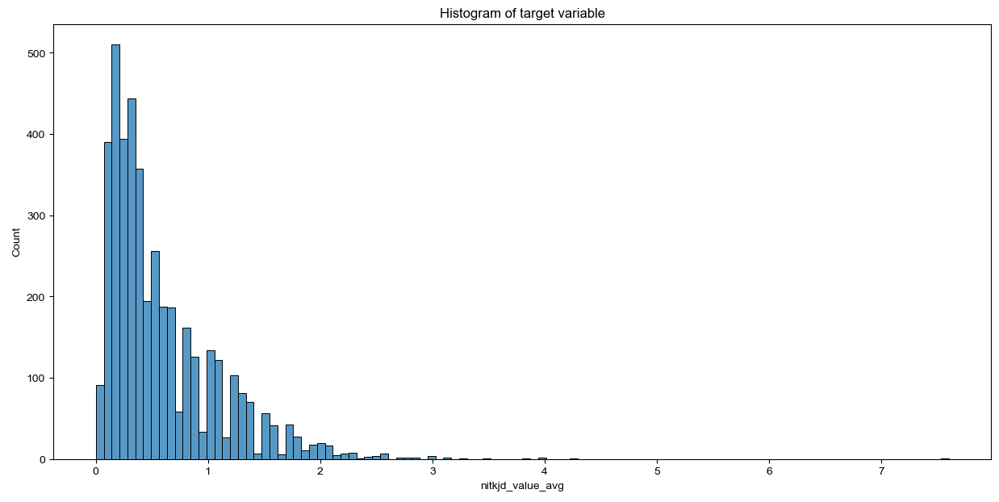

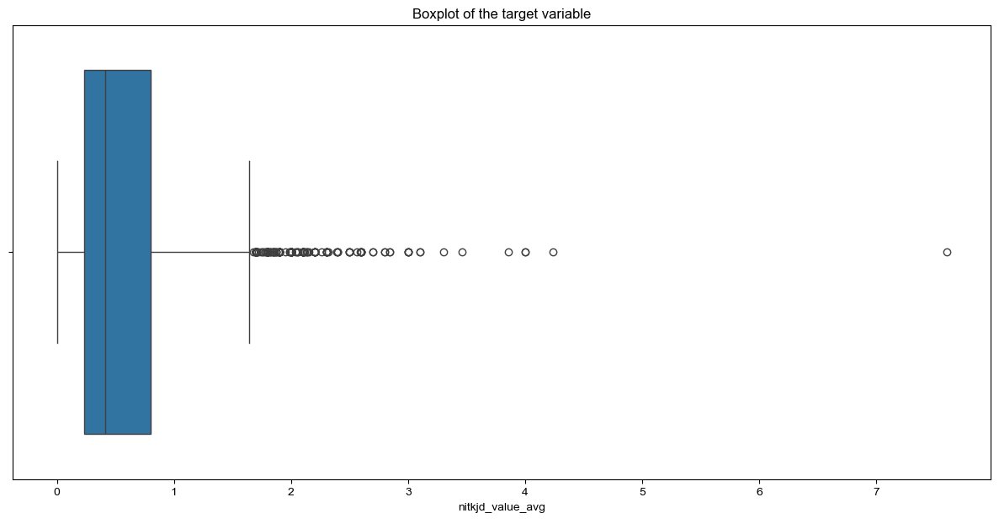

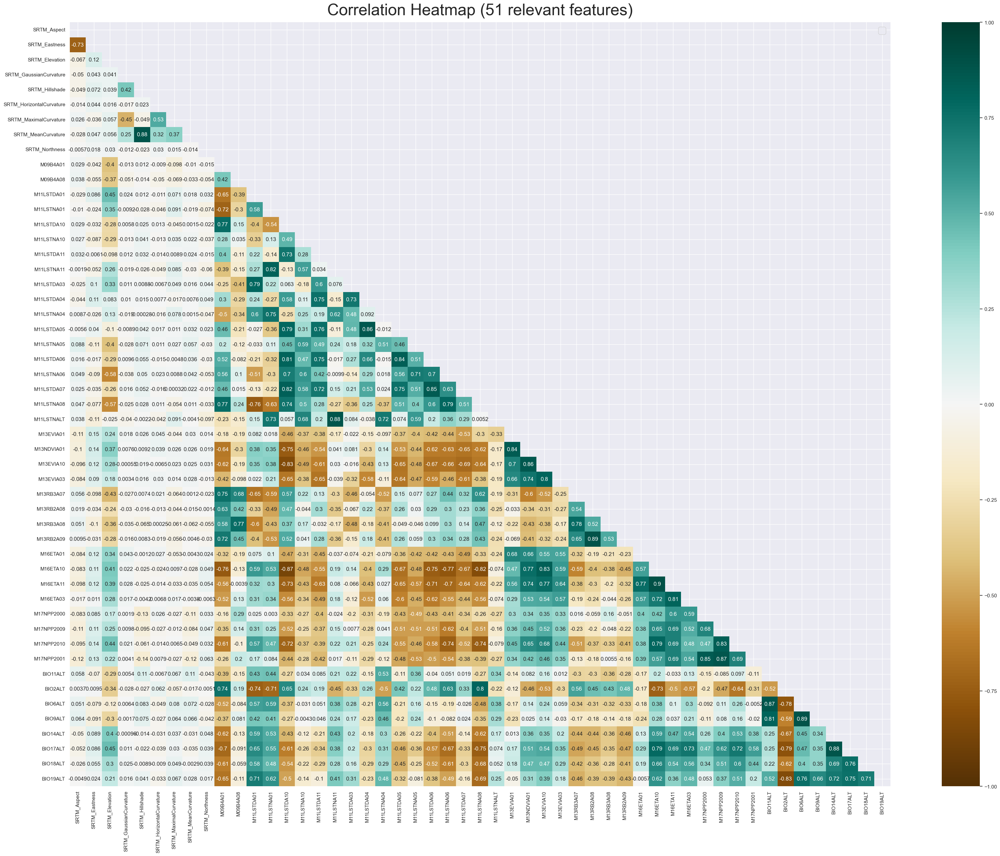

In [5]:
%%time

obs, highly_correlated_features, relevant_features = explore.eda(obs, features, target, key_column, remove_na_rows= True, 
                                                                 find_highly_corr_features= True, corr_threshold= 0.9, 
                                                                 out_plot_hist_target_file = "saved/plots/target_hist_plot.png",
                                                                 out_boxplot_target_file = "saved/plots/target_box_plot.png",
                                                                 out_plot_heatmap_file= "saved/plots/features_corr_plot.png")

with open("saved/data/relevant_features.pickle", 'wb') as f:
    pickle.dump(relevant_features, f)

### Remove outliers from data

In [6]:
%%time

Q1 = obs[target].quantile(0.25)
Q3 = obs[target].quantile(0.75)
IQR = Q3 - Q1    #IQR is interquartile range. 
filter = (obs[target] >= Q1 - 1.5 * IQR) & (obs[target] <= Q3 + 1.5 *IQR)
count_normal_data = sum(filter)
count_outlier_data = sum(filter==False)
perc_of_outliers = round( (count_outlier_data / len(filter))*100, 2)

obs = obs[filter]
obs.shape[0]

print("Number of normal data:", count_normal_data)
print("Number of outlier data:", count_outlier_data)
print("Percentage of outliers (%):", perc_of_outliers)

Number of normal data: 4033
Number of outlier data: 187
Percentage of outliers (%): 4.43
CPU times: total: 31.2 ms
Wall time: 22.2 ms


### Review the distribution of the target data after removing outliers

CPU times: total: 766 ms
Wall time: 763 ms


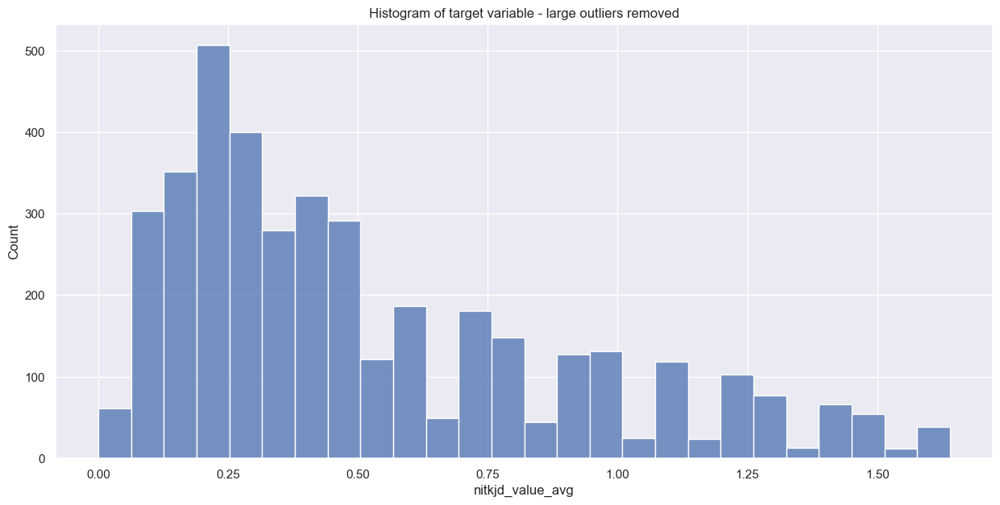

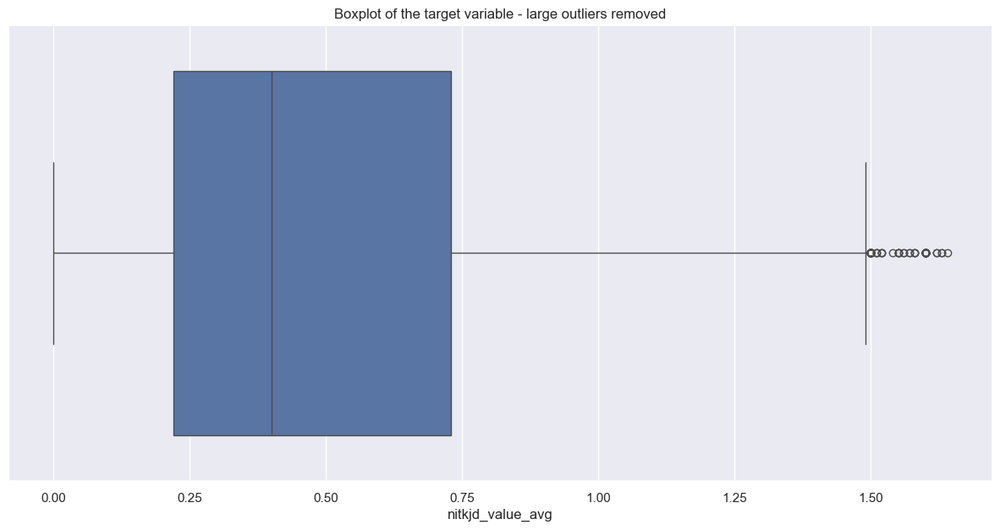

In [7]:
%%time

# Visualize histogram of target variable
plt.figure(figsize=(15, 7))
sns.histplot(data=obs, x=target).set_title('Histogram of target variable - large outliers removed')
plt.savefig("saved/plots/target_hist_plot2.png", dpi=300, bbox_inches= "tight")

# Visualize outliers in target variable using boxplot
plt.figure(figsize=(15, 7))
sns.boxplot(data=obs, x=target).set_title('Boxplot of the target variable - large outliers removed')
plt.savefig("saved/plots/target_box_plot2.png", dpi=300, bbox_inches= "tight")

### Preprocessing - Subset dataset using relevant features

In [8]:
%%time

all_features  = relevant_features + [target]
data_features, data_target = preprocess.subset_observation_data(obs, relevant_features, target)

data_features.head()

CPU times: total: 0 ns
Wall time: 2 ms


,SRTM_Aspect,SRTM_Eastness,SRTM_Elevation,SRTM_GaussianCurvature,SRTM_Hillshade,SRTM_HorizontalCurvature,SRTM_MaximalCurvature,SRTM_MeanCurvature,SRTM_Northness,M09B4A01,...,M17NPP2010,M17NPP2001,BIO11ALT,BIO2ALT,BIO6ALT,BIO9ALT,BIO14ALT,BIO17ALT,BIO18ALT,BIO19ALT
0,94.772605,0.996533,299.743532,1.830000e-08,0.999987,-0.000141,-0.000076,-0.000159,-0.083201,0.081344,...,0.2645,0.1140,25.9,12.5,17.2,26.3,2.0,11.0,187.0,680.0
1,285.623279,-0.963053,329.515390,1.910000e-08,0.999823,0.000128,0.000156,0.000139,0.269311,0.099240,...,0.1215,0.0688,25.6,12.2,17.7,26.6,2.0,13.0,203.0,695.0
2,188.968174,-0.155886,310.898924,1.900000e-08,0.999626,-0.000108,-0.000108,-0.000142,-0.987775,0.100710,...,0.1674,0.0498,25.5,12.0,18.1,26.8,2.0,14.0,215.0,698.0
3,32.345325,0.535021,302.960668,-2.970000e-10,0.999753,0.000073,0.000074,0.000035,0.844839,0.094550,...,0.2702,0.1702,26.0,12.5,17.2,26.2,1.0,8.0,182.0,14.0
4,32.345325,0.535021,302.960668,-2.970000e-10,0.999753,0.000073,0.000074,0.000035,0.844839,0.094550,...,0.2702,0.1702,26.0,12.5,17.2,26.2,1.0,8.0,182.0,14.0


### Preprocessing - Train-Test Splitting

In [9]:
%%time

X_train, X_test, y_train, y_test = preprocess.train_test_splitting(data_features, data_target, test_size= 0.2)

X_train.shape[0] / data_features.shape[0] * 100

with open("saved/data/X_test.pickle", 'wb') as f:
    pickle.dump(X_test, f)
    
with open("saved/data/y_test.pickle", 'wb') as f:
    pickle.dump(y_test, f)

CPU times: total: 0 ns
Wall time: 1.57 ms


### Preprocessing - Define a Machine Learning model pipeline with data standardization

In [10]:
%%time

model = preprocess.define_model_pipeline(preprocessor= StandardScaler(), processor= RandomForestRegressor())

# Show the model steps
print(model.named_steps)

# Show the model hyperparameters
print(model.get_params())

model

{'standardscaler': StandardScaler(), 'randomforestregressor': RandomForestRegressor()}
{'memory': None, 'steps': [('standardscaler', StandardScaler()), ('randomforestregressor', RandomForestRegressor())], 'verbose': False, 'standardscaler': StandardScaler(), 'randomforestregressor': RandomForestRegressor(), 'standardscaler__copy': True, 'standardscaler__with_mean': True, 'standardscaler__with_std': True, 'randomforestregressor__bootstrap': True, 'randomforestregressor__ccp_alpha': 0.0, 'randomforestregressor__criterion': 'squared_error', 'randomforestregressor__max_depth': None, 'randomforestregressor__max_features': 1.0, 'randomforestregressor__max_leaf_nodes': None, 'randomforestregressor__max_samples': None, 'randomforestregressor__min_impurity_decrease': 0.0, 'randomforestregressor__min_samples_leaf': 1, 'randomforestregressor__min_samples_split': 2, 'randomforestregressor__min_weight_fraction_leaf': 0.0, 'randomforestregressor__n_estimators': 100, 'randomforestregressor__n_jobs': 

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestregressor', RandomForestRegressor())])

### Processing - Train Random Forest (just a single train/test split)

In [11]:
%%time

model = ml_process.train_machine_learning_model(model, X_train, y_train, X_test, y_test)

Train Score: 0.83  Test Score: 0.6  Training Elapsed Time: 4.58 sec
CPU times: total: 4.58 s
Wall time: 4.63 s


### Hyperparameter Tuning

In [12]:
%%time

# Because of the pipeline, we have to indicate the name of the object where the param is to be applied as a prefix__
# rf_grid = {"randomforestregressor__n_estimators": np.arange(10, 100, 10),
#            "randomforestregressor__max_depth": [1, 3, 5, 10, 15],
#            "randomforestregressor__min_samples_split": np.arange(2, 20, 2),
#            "randomforestregressor__min_samples_leaf": np.arange(1, 20, 2),
#            "randomforestregressor__max_samples": [1000]}

rf_grid = {"randomforestregressor__n_estimators": randint(10, 100),
           "randomforestregressor__max_depth": randint(1, 20),
           "randomforestregressor__min_samples_split": randint(2, 20),
           "randomforestregressor__min_samples_leaf": randint(1, 20),
           "randomforestregressor__max_samples": [1000]}

# Instantiate RandomizedSearchCV model
random_search = RandomizedSearchCV(model,
                              param_distributions=rf_grid,
                              scoring="r2",
                              n_iter=500,
                              cv=5,
                              verbose=True)
# fit
random_search.fit(X_train, y_train)

Fitting 5 folds for each of 500 candidates, totalling 2500 fits
CPU times: total: 22min 56s
Wall time: 22min 56s


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('randomforestregressor',
                                              RandomForestRegressor())]),
                   n_iter=500,
                   param_distributions={'randomforestregressor__max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002F7AB9C8BB0>,
                                        'randomforestregressor__max_samples': [1000],
                                        'randomforestregress...scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002F7AB9C89D0>,
                                        'randomforestregressor__min_samples_split': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002F7AB994EB0>,
                                        'randomforestregressor__n_estimators': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x000002F7ABD842E0>},
                   scoring='r2', verbose=True)

### Rename Hyperparameter CV Results columns

In [13]:
results = random_search.cv_results_
df = pd.DataFrame(results)
df['iteration'] = range(1, len(df) + 1)

df = df.rename(columns={"param_randomforestregressor__max_depth": "param_max_depth",
                        "param_randomforestregressor__n_estimators": "param_n_estimators",
                        "param_randomforestregressor__min_samples_split": "param_min_samples_split",
                        "param_randomforestregressor__min_samples_leaf": "param_min_samples_leaf",
                        "param_randomforestregressor__max_samples": "param_max_samples"})

display(df.head())

print("best estimator: ", random_search.best_estimator_)
print("best estimator cv score:" , round(random_search.best_score_,2))

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_max_samples,param_min_samples_leaf,param_min_samples_split,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score,iteration
0,0.397549,0.019726,0.003561,0.002913,3,1000,13,9,70,"{'randomforestregressor__max_depth': 3, 'rando...",0.513221,0.458424,0.564469,0.461189,0.539856,0.507432,0.042139,434,1
1,0.999990,0.010806,0.006118,0.000041,12,1000,13,16,92,"{'randomforestregressor__max_depth': 12, 'rand...",0.548882,0.509663,0.599872,0.507425,0.587933,0.550755,0.038378,194,2
2,0.835068,0.013126,0.007043,0.001924,15,1000,10,6,71,"{'randomforestregressor__max_depth': 15, 'rand...",0.553468,0.510048,0.597653,0.518331,0.590607,0.554021,0.035917,163,3
3,1.153658,0.010380,0.008334,0.005554,12,1000,7,6,92,"{'randomforestregressor__max_depth': 12, 'rand...",0.555436,0.525891,0.614250,0.535133,0.597363,0.565615,0.034595,23,4
4,0.193636,0.002204,0.003377,0.001601,3,1000,19,16,35,"{'randomforestregressor__max_depth': 3, 'rando...",0.505750,0.452394,0.564856,0.461110,0.539507,0.504723,0.043514,443,5


best estimator:  Pipeline(steps=[('standardscaler', StandardScaler()),
                ('randomforestregressor',
                 RandomForestRegressor(max_depth=16, max_samples=1000,
                                       min_samples_leaf=2, n_estimators=89))])
best estimator cv score: 0.57


### Plot Hyperparameter Results

Plot iteration vs Mean Test Score

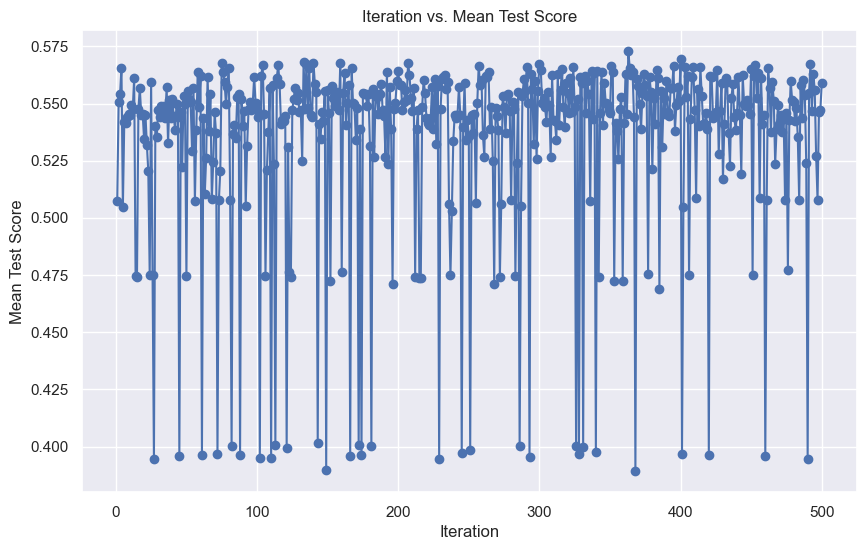

In [14]:
plt.figure(figsize=(10, 6))
plt.plot(df['iteration'], df['mean_test_score'], marker='o')
plt.xlabel('Iteration')
plt.ylabel('Mean Test Score')
plt.title('Iteration vs. Mean Test Score')
plt.grid(True)
plt.show()

Parallel Coordinate Plot of all parameters

In [15]:
# Convert hyperparameters to string for better visualization
df['param_max_depth'] = df['param_max_depth'].astype(int)
df['param_n_estimators'] = df['param_n_estimators'].astype(int)
df['param_min_samples_split'] = df['param_min_samples_split'].astype(int)
df['param_min_samples_leaf'] = df['param_min_samples_leaf'].astype(int)
df['param_max_samples'] = df['param_max_samples'].astype(int)


fig = px.parallel_coordinates(
    df,
    dimensions=['param_n_estimators','param_max_depth', 'param_min_samples_split', 'param_min_samples_leaf','param_max_samples', 'mean_test_score'],
    color='mean_test_score',
    color_continuous_scale=px.colors.sequential.Viridis
)
# fig.update_layout(title='Parallel Coordinates Plot of Hyperparameters and Mean Test Score')
fig.show()

fig.write_image("saved/plots/hyperparams_vs_mean_test_score.png", width=1500, scale=1)

### Best Model Selection

In [16]:
model = random_search.best_estimator_

### Processing - Validation curve of max_depth to assess Overfitting and Underfitting

Checking if there is the need to tune the max_depth hyperparameter which is set to None by default.

CPU times: total: 375 ms
Wall time: 37 s


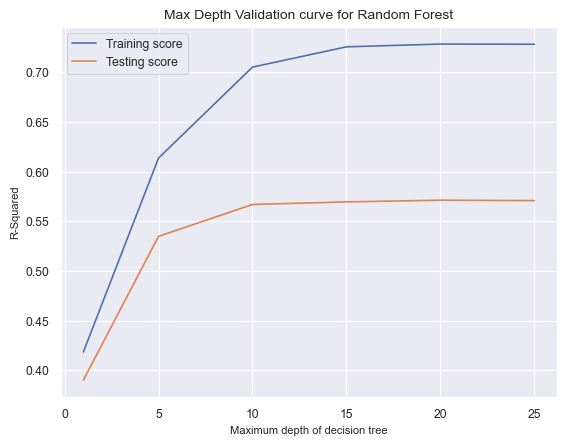

In [17]:
%%time

max_depth = [1, 5, 10, 15, 20, 25]
ml_process.assess_max_depth_cv_curve(model, max_depth, data_features, data_target, "randomforestregressor__max_depth",                                     
                                  cv_n_splits= 10, cv_test_size= 0.2, cv_random_state= 0, 
                                  out_plot_file="saved/plots/RF_validation_curve.png")

### Processing - Retrain the selected model on entire training set so it knows well about the entire training data

In [18]:
%%time

# Fit on train data
model = ml_process.train_machine_learning_model(model, X_train, y_train, X_test, y_test)

Train Score: 0.72  Test Score: 0.62  Training Elapsed Time: 1.58 sec
CPU times: total: 1.58 s
Wall time: 1.62 s


### Processing - Final Model Evaluation on Unseen Test Data

In [19]:
%%time

model.score(X_test, y_test)

CPU times: total: 15.6 ms
Wall time: 12.1 ms


0.6222199428326419

### Train a Quantile Random Forest Model based on best hyperparameters to be used for uncertainty estimation

In [20]:
random_search.best_params_

{'randomforestregressor__max_depth': 16,
 'randomforestregressor__max_samples': 1000,
 'randomforestregressor__min_samples_leaf': 2,
 'randomforestregressor__min_samples_split': 2,
 'randomforestregressor__n_estimators': 89}

In [21]:
model_qrf = preprocess.define_model_pipeline(preprocessor= StandardScaler(), 
                                             processor= RandomForestQuantileRegressor(max_depth=15,max_samples=1000,min_samples_leaf=3,min_samples_split=10,n_estimators=60))

# Fit on train data
model_qrf = ml_process.train_machine_learning_model(model_qrf, X_train, y_train, X_test, y_test)

Train Score: 0.69  Test Score: 0.59  Training Elapsed Time: 0.97 sec


### Save Models

In [22]:
%%time

with open("saved/model/ml_model.pickle", 'wb') as f:
    pickle.dump(model, f)
    
with open("saved/model/ml_model_qrf.pickle", 'wb') as f:
    pickle.dump(model_qrf, f)   

CPU times: total: 0 ns
Wall time: 12.3 ms


### Processing - Random Forest Feature Importance

Gini Importance or Mean Decrease in Impurity (MDI) calculates each feature importance as the sum over the number of splits (across all tress) that include the feature, proportionally to the number of samples it splits

CPU times: total: 891 ms
Wall time: 897 ms


<Figure size 640x480 with 0 Axes>

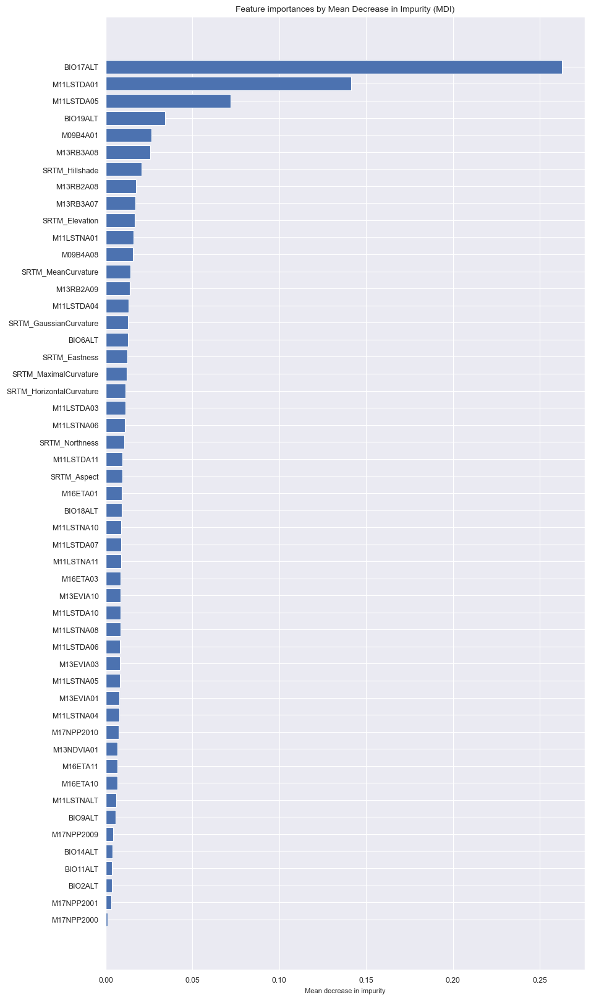

In [23]:
%%time

ml_process.assess_feature_importance(model,X_train, out_plot_file="saved/plots/RF_feature_importance.png")

### Processing - Assess Model Accuracy Metrics

Correlation between observed and predicted is:  0.84
RMSE between observed and predicted is:  0.21
MAE between observed and predicted is:  0.15
Explained Variance between observed and predicted is:  0.7
CPU times: total: 3.16 s
Wall time: 540 ms


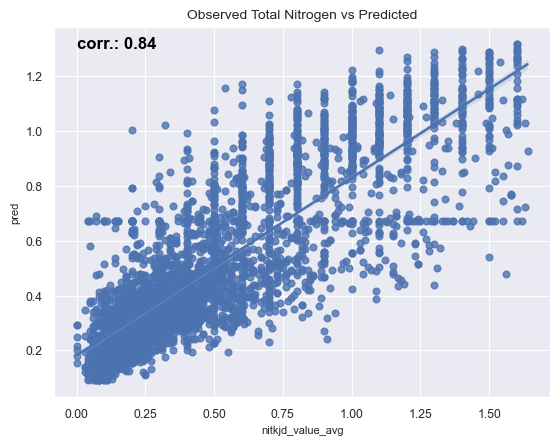

In [24]:
%%time

[corr, rmse, mae, r2] = ml_process.assess_accuracy_metrics(model, obs, relevant_features, target, out_plot_file="saved/plots/obs_vs_pred.png")

### Processing - Random Forest Prediction on Grid1km

In [25]:
%%time

make_new_predictions = True

if os.path.exists("saved/data/grid1km_pred.gpkg") and make_new_predictions == False:
     grid1km = read_dataframe("saved/data/grid1km_pred.gpkg", layer= "grid1km_pred")
else:
     grid1km = ml_process.predict_trend_on_grid(model,model_qrf, relevant_features, grid1km, quantiles= [0.05, 0.5, 0.95],
                                out_pred_gpkg_file= "saved/data/grid1km_pred.gpkg", 
                                out_pred_trend_rast_file= "saved/data/pred1km_n_g_kg.tif",
                                out_pred_median_rast_file= "saved/data/pred1km_median_n_g_kg.tif",
                                out_pred_uncertainty_rast_file= "saved/data/pred1km_uncertainty_n_g_kg.tif")
        

# Time taken for server computer
# 2h 45min 15s

# Time taken for Lenovo laptop
# 2h 30min

CPU times: total: 2h 7min 57s
Wall time: 2h 8min 4s


In [26]:
grid1km.head()

,pk,SRTM_Aspect,SRTM_Eastness,SRTM_Elevation,SRTM_GaussianCurvature,SRTM_Hillshade,SRTM_HorizontalCurvature,SRTM_MaximalCurvature,SRTM_MeanCurvature,SRTM_MinimalCurvature,...,BIO17ALT,BIO18ALT,BIO19ALT,BIO3ALT,geometry,pred_trend,pred_q5,pred_q50,pred_q95,uncertainty
0,1,0.236251,0.004123,168.297792,-8.970000e-06,0.586693,0.000131,0.001007,-0.003952,-0.008910,...,0.0,49.0,0.0,56.0,POINT (745227.859 1668034.081),0.266679,0.0400,0.150,1.0300,6.600000
1,2,359.885275,-0.002002,212.246695,3.620000e-07,0.467907,0.000010,0.001408,0.000833,0.000257,...,0.0,49.0,0.0,56.0,POINT (746227.859 1668034.082),0.244824,0.0685,0.170,0.7715,4.135294
2,3,0.262393,0.004580,210.988476,-3.680000e-06,0.468140,-0.000106,0.002839,0.000771,-0.001297,...,0.0,49.0,0.0,56.0,POINT (747227.859 1668034.081),0.260341,0.0400,0.150,0.5530,3.420000
3,4,359.909342,-0.001582,212.514421,-5.710000e-07,0.466770,-0.000016,0.001932,0.000818,-0.000296,...,0.0,49.0,0.0,56.0,POINT (748227.859 1668034.081),0.214345,0.0400,0.140,0.5020,3.300000
4,5,359.858277,-0.002474,243.589338,-1.220000e-06,0.658715,-0.000047,0.005007,0.002382,-0.000244,...,0.0,49.0,0.0,56.0,POINT (749227.859 1668034.081),0.245708,0.0400,0.145,0.5020,3.186207


### Plot ML Prediction mean,median,uncertainty - Vector

#### Mean

CPU times: total: 18.8 s
Wall time: 18.9 s


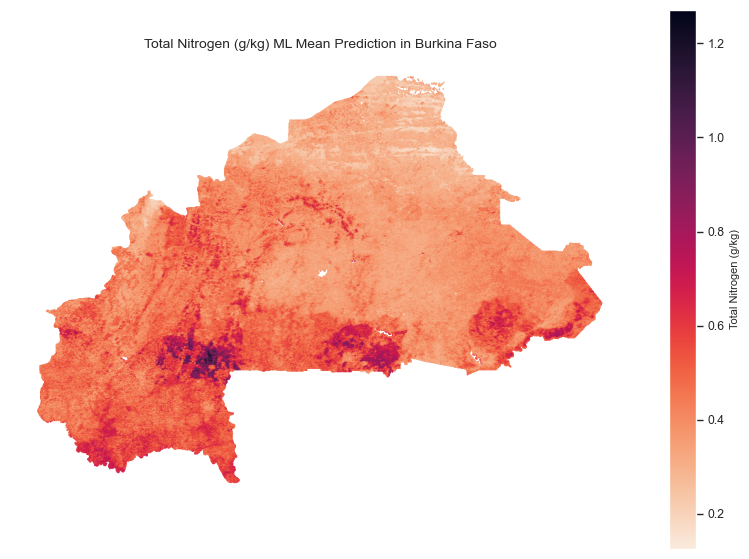

In [126]:
%%time

cmap = sns.color_palette("rocket_r", as_cmap=True)
ax = grid1km.plot(column= "pred_trend", legend= True, legend_kwds={"label": "Total Nitrogen (g/kg)"}, figsize= (10,7), cmap=cmap, markersize= 0.1)
ax.axis("off")
ax.set_title("Total Nitrogen (g/kg) ML Mean Prediction in Burkina Faso")
# plt.savefig("saved/plots/TotalN_pred_mean.png", dpi=300, bbox_inches= "tight")

#### Mean - Raster (NA values are not mapped)

CPU times: total: 1.02 s
Wall time: 1.02 s


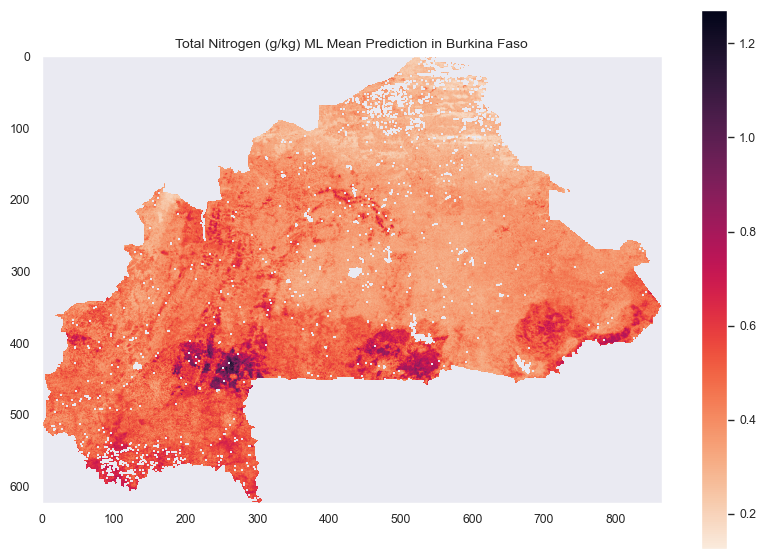

In [28]:
%%time

grid1km_raster = rxr.open_rasterio("saved/data/pred1km_n_g_kg.tif").squeeze()

fig, ax = plt.subplots(figsize=(10, 7))
plt.grid(None)
ax.set_title("Total Nitrogen (g/kg) ML Mean Prediction in Burkina Faso")
ax.imshow(grid1km_raster,cmap=cmap)
ax_img = ax.get_children()[0]
plt.colorbar(ax_img)

# plt.savefig("saved/plots/TotalN_pred_mean_raster.png", dpi=300, bbox_inches= "tight")

#### Quantiles q5,q50,q95

CPU times: total: 1min
Wall time: 1min


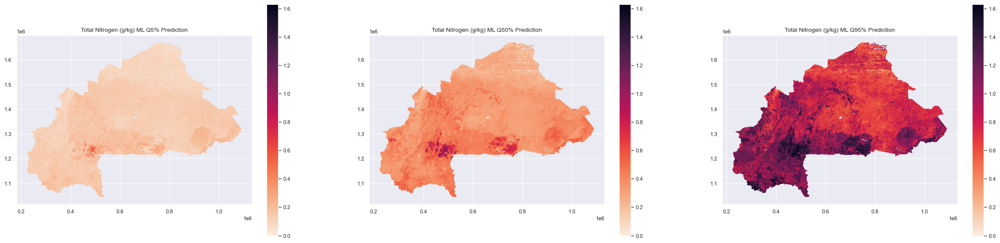

In [96]:
%%time

cmap = sns.color_palette("rocket_r", as_cmap=True)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 7))
for ax in axes.flat:
    ax.axis('off')

# vmin and vmax for using to same scale for plotting
vmin = min(grid1km['pred_q5'])
vmax = max(grid1km['pred_q95'])

grid1km.plot(column= "pred_q5",  legend= True, cmap= cmap, markersize= 0.1, ax=axes[0], vmin= vmin, vmax= vmax)
axes[0].set_title("Total Nitrogen (g/kg) ML Q5% Prediction")

grid1km.plot(column= "pred_q50", legend= True, cmap= cmap, markersize= 0.1, ax=axes[1], vmin= vmin, vmax= vmax)
axes[1].set_title("Total Nitrogen (g/kg) ML Q50% Prediction")

grid1km.plot(column= "pred_q95", legend= True, cmap= cmap, markersize= 0.1, ax=axes[2], vmin= vmin, vmax= vmax)
axes[2].set_title("Total Nitrogen (g/kg) ML Q95% Prediction")

# plt.savefig("saved/plots/TotalN_pred_q5_q50_q95.png", dpi=300, bbox_inches= "tight")

#### Uncertainty = (q95 - q5)/q50 OR IQR/Median

CPU times: total: 18.5 s
Wall time: 18.6 s


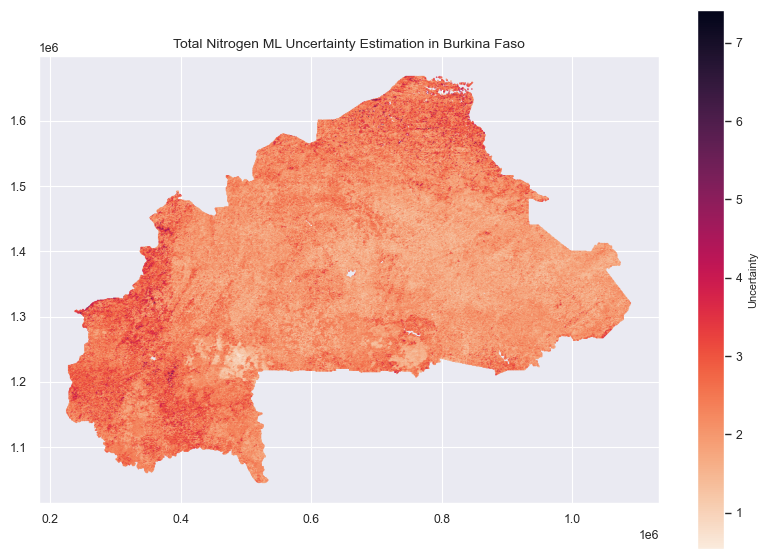

In [97]:
%%time

cmap = sns.color_palette("rocket_r", as_cmap=True)
ax = grid1km.plot(column= "uncertainty", legend= True, legend_kwds={"label": "Uncertainty"}, figsize= (10,7), cmap=cmap, markersize= 0.1)
ax.axis('off')
ax.set_title("Total Nitrogen ML Uncertainty Estimation in Burkina Faso")
# plt.savefig("saved/plots/TotalN_pred_uncertainty.png", dpi=300, bbox_inches= "tight")

In [31]:
grid1km['uncertainty'].describe()

count    269283.000000
mean          2.124643
std           0.545092
min           0.538462
25%           1.740625
50%           2.040000
75%           2.407143
max           7.417647
Name: uncertainty, dtype: float64

In [32]:
grid1km['pred_trend']

0         0.266679
1         0.244824
2         0.260341
3         0.214345
4         0.245708
            ...   
273105    0.592943
273106    0.559509
273107    0.551650
273108    0.584496
273109         NaN
Name: pred_trend, Length: 273110, dtype: float64

# Explainable AI using SHAP

https://wires.onlinelibrary.wiley.com/doi/full/10.1002/widm.1493

https://www.sciencedirect.com/science/article/pii/S0198971522000898#s0010

https://www.datacamp.com/tutorial/introduction-to-shap-values-machine-learning-interpretability

https://shap.readthedocs.io/en/latest/example_notebooks/tabular_examples/tree_based_models/Force%20Plot%20Colors.html

## Load saved data (for fast debugging purposes)

In [34]:
# %%time

if os.path.exists("saved/data/grid1km_pred.gpkg"):
     grid1km = read_dataframe("saved/data/grid1km_pred.gpkg", layer = "grid1km_pred")
     qry_subset = grid1km['pred_trend'].isna() == False
     grid1km_subset = grid1km[qry_subset].copy().reset_index(drop=True)
    #  grid1km_subset = grid1km_subset.reset_index(drop=True) # necessary to allow easy index matching with the shap results
        
with open("saved/data/relevant_features.pickle", 'rb') as f:
    relevant_features           = pickle.load(f)
    relevant_features_shap      = [f + "_shap" for f in relevant_features]
    relevant_features_shap_perc = [f + "_shap_perc" for f in relevant_features]
        
with open("saved/data/grid1km_pred_shap.pickle", 'rb') as f:
    grid1km_pred_shap   = pickle.load(f)
    shap_values_df      = grid1km_pred_shap[relevant_features_shap]
    shap_values_df      = shap_values_df[qry_subset].copy().reset_index(drop=True)

    shap_values_perc_df = grid1km_pred_shap[relevant_features_shap_perc]
    shap_values_perc_df = shap_values_perc_df[qry_subset].copy().reset_index(drop=True)

    local_vimp          = grid1km_pred_shap['local_vimp']
    local_vimp          = local_vimp[qry_subset].copy().reset_index(drop=True)
    
        
with open("saved/model/ml_model.pickle", 'rb') as f:
    model = pickle.load(f)
    
    # needed for force plots
    scaler = model[0]
    X_grid_scaled_df = pd.DataFrame(scaler.transform(grid1km[relevant_features]), columns = relevant_features)
    
with open("saved/model/explainer.pickle", 'rb') as f:
    explainer = pickle.load(f)
    
with open("saved/data/X_test.pickle", 'rb') as f:
    X_test = pickle.load(f)
    
with open("saved/data/y_test.pickle", 'rb') as f:
    y_test = pickle.load(f)
    


### Understanding the model using the test dataset X_test

In [34]:
X_test

,SRTM_Aspect,SRTM_Eastness,SRTM_Elevation,SRTM_GaussianCurvature,SRTM_Hillshade,SRTM_HorizontalCurvature,SRTM_MaximalCurvature,SRTM_MeanCurvature,SRTM_Northness,M09B4A01,...,M17NPP2010,M17NPP2001,BIO11ALT,BIO2ALT,BIO6ALT,BIO9ALT,BIO14ALT,BIO17ALT,BIO18ALT,BIO19ALT
1152,60.123110,0.867098,268.762323,7.090000e-09,0.999998,0.000044,0.000288,0.000156,0.498138,0.168162,...,0.0000,0.0000,24.6,15.3,14.2,25.0,0.0,0.0,90.0,0.0
665,282.619066,-0.975844,313.015374,-7.160000e-11,0.999953,0.000019,0.000226,0.000113,0.218468,0.141954,...,0.0646,0.0000,25.5,13.4,16.5,25.5,0.0,0.0,67.0,0.0
678,183.583704,-0.062507,310.005057,8.150000e-09,0.999660,0.000187,0.000220,0.000129,-0.998045,0.135700,...,0.0158,0.0000,25.5,13.4,16.5,25.6,0.0,1.0,67.0,1.0
2887,40.321014,0.647069,238.336390,-6.550000e-09,0.999995,-0.000044,0.000044,-0.000053,0.762431,0.161312,...,0.0176,0.0000,25.3,14.3,15.8,27.3,0.0,0.0,90.0,0.0
2035,344.301729,-0.270571,324.417655,-9.930000e-10,0.999950,0.000126,0.000200,0.000097,0.962700,0.127917,...,0.1531,0.0000,24.2,13.9,13.7,24.2,0.0,2.0,90.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1880,63.339596,0.893682,324.121133,-4.740000e-09,0.999937,-0.000015,0.000033,-0.000055,0.448701,0.113433,...,0.2569,0.1192,24.7,13.8,14.4,24.9,1.0,7.0,138.0,14.0
1599,181.496478,-0.026115,211.893750,-4.300000e-10,0.999656,0.000006,0.000015,-0.000006,-0.999659,0.091877,...,0.0779,0.0000,26.4,13.4,17.4,26.8,0.0,1.0,112.0,2.0
2260,128.714869,0.780268,262.679690,-1.630000e-08,0.999703,0.000063,0.000132,0.000004,-0.625445,0.160456,...,0.0386,0.0000,25.4,14.3,15.7,25.6,0.0,0.0,137.0,0.0
1985,134.706827,0.710716,372.353538,-4.370000e-09,0.999825,0.000046,0.000046,-0.000025,-0.703479,0.115181,...,0.1774,0.0000,24.0,13.7,13.7,24.1,0.0,2.0,100.0,7.0


In [35]:
%%time

# using the pipeline model which would scale the X_test feature values before prediction
y_test_pred = model.predict(X_test)
y_test_pred[:5]

CPU times: total: 15.6 ms
Wall time: 15.6 ms


array([0.2994829 , 0.55477503, 0.35039663, 0.1366129 , 0.28361177])

### Create an explainer on the machine learning model

In [5]:
%%time

explainer = xai.create_shap_explainer(model, use_fasttreeshap= True, out_explainer_file= None)
explainer

# with open("saved/model/explainer.pickle", 'wb') as f:
#      pickle.dump(explainer, f)

CPU times: total: 15.6 ms
Wall time: 23.7 ms


### Test Data: Calculate Local Interpretability

In [37]:
%%time

# Scaling the X_test features because the model was trained on scaled training features
scaler = model[0]
X_test_scaled    = scaler.transform(X_test)
X_test_scaled_df = pd.DataFrame(X_test_scaled, columns = X_test.columns)

[shap_values_df, shap_values_perc_df, local_vimp] = xai.calc_local_interpretability(explainer, X_test_scaled_df)

#### Notes
# Lenono Computer
# Time take for SHAP: 56s
# Time taken for FastTreeSHAP: 34.3s


CPU times: total: 4.75 s
Wall time: 4.8 s


In [38]:
print("y_test_pred", y_test_pred[:5])

print("shap_calculated", np.array(explainer.expected_value[0] + shap_values_df.sum(axis=1))[:5])

a = y_test_pred
b = explainer.expected_value[0] + shap_values_df.sum(axis=1)
c = round(np.corrcoef(a,b)[0,1], 2)
rmse = math.sqrt(mean_squared_error(a,b))

print ("corr: ", c, "rmse: ", rmse)


y_test_pred [0.2994829  0.55477503 0.35039663 0.1366129  0.28361177]
shap_calculated [0.2994829  0.55477503 0.35039663 0.1366129  0.28361177]
corr:  1.0 rmse:  6.220316574973411e-16


In [39]:
sum(X_test_scaled_df.isnull().any())

0

In [40]:
shap_values_df

,SRTM_Aspect_shap,SRTM_Eastness_shap,SRTM_Elevation_shap,SRTM_GaussianCurvature_shap,SRTM_Hillshade_shap,SRTM_HorizontalCurvature_shap,SRTM_MaximalCurvature_shap,SRTM_MeanCurvature_shap,SRTM_Northness_shap,M09B4A01_shap,...,M17NPP2010_shap,M17NPP2001_shap,BIO11ALT_shap,BIO2ALT_shap,BIO6ALT_shap,BIO9ALT_shap,BIO14ALT_shap,BIO17ALT_shap,BIO18ALT_shap,BIO19ALT_shap
0,0.000428,0.003749,-0.003636,-0.001009,0.007706,-0.000728,-0.002558,0.002609,-0.002755,-0.021094,...,0.005010,-0.000643,-0.006060,-0.000467,-0.036253,-0.004955,-0.002428,-0.090970,-0.001001,-0.015567
1,-0.001657,0.019418,-0.000153,-0.001600,0.002608,-0.001753,-0.002882,0.006313,-0.001187,-0.019057,...,-0.000274,-0.000333,0.001389,-0.000332,0.000825,0.003057,-0.002431,-0.059275,-0.002878,-0.014552
2,-0.002234,-0.001805,-0.002022,0.000025,-0.005422,-0.002030,-0.000418,0.001423,0.003580,-0.011974,...,0.003466,-0.000270,0.002131,0.000344,0.000267,-0.000666,-0.002490,-0.078058,-0.002648,-0.017288
3,0.000152,-0.002095,-0.004640,0.001338,0.003379,-0.002193,0.000191,-0.002489,-0.002324,-0.025127,...,-0.002876,-0.000444,0.000283,0.001293,-0.033656,-0.003586,-0.002667,-0.104190,-0.003900,-0.017971
4,0.002166,-0.001423,0.002093,-0.001641,0.000683,-0.001341,-0.002661,-0.003626,0.001955,-0.010217,...,-0.001927,-0.000399,-0.016971,0.000058,-0.032173,-0.008091,-0.002392,-0.092607,-0.005966,-0.017590
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
802,-0.000907,0.003156,0.002692,0.000100,0.003877,-0.002714,0.001570,-0.001141,-0.001970,0.005807,...,0.002048,0.005866,-0.001309,0.001051,-0.019335,-0.005031,-0.001021,0.146114,0.002913,-0.014970
803,-0.001750,-0.001887,-0.000834,0.000978,-0.008372,-0.002790,0.002119,-0.000884,0.011928,0.012917,...,-0.001021,-0.000067,0.006201,0.000176,0.010817,0.000467,-0.003040,-0.061285,-0.002144,-0.013597
804,-0.001739,-0.000952,-0.001085,-0.000102,-0.008965,-0.001732,-0.001908,-0.001776,-0.002659,-0.019025,...,0.000667,-0.000318,0.001496,0.001697,-0.015291,-0.000599,-0.002420,-0.081839,0.016981,-0.018071
805,-0.002376,0.002877,0.013876,-0.000526,-0.002842,-0.000703,0.002461,0.000327,-0.001233,-0.005043,...,-0.000310,-0.001075,-0.011342,0.001474,-0.031997,-0.006966,-0.002019,-0.088666,-0.005324,-0.015427


In [41]:
shap_values_perc_df

,SRTM_Aspect_shap_perc,SRTM_Eastness_shap_perc,SRTM_Elevation_shap_perc,SRTM_GaussianCurvature_shap_perc,SRTM_Hillshade_shap_perc,SRTM_HorizontalCurvature_shap_perc,SRTM_MaximalCurvature_shap_perc,SRTM_MeanCurvature_shap_perc,SRTM_Northness_shap_perc,M09B4A01_shap_perc,...,M17NPP2010_shap_perc,M17NPP2001_shap_perc,BIO11ALT_shap_perc,BIO2ALT_shap_perc,BIO6ALT_shap_perc,BIO9ALT_shap_perc,BIO14ALT_shap_perc,BIO17ALT_shap_perc,BIO18ALT_shap_perc,BIO19ALT_shap_perc
0,0.1,1.0,-1.0,-0.3,2.1,-0.2,-0.7,0.7,-0.7,-5.7,...,1.3,-0.2,-1.6,-0.1,-9.7,-1.3,-0.7,-24.4,-0.3,-4.2
1,-0.5,5.5,-0.0,-0.5,0.7,-0.5,-0.8,1.8,-0.3,-5.4,...,-0.1,-0.1,0.4,-0.1,0.2,0.9,-0.7,-16.8,-0.8,-4.1
2,-0.9,-0.7,-0.8,0.0,-2.1,-0.8,-0.2,0.5,1.4,-4.6,...,1.3,-0.1,0.8,0.1,0.1,-0.3,-1.0,-30.0,-1.0,-6.7
3,0.0,-0.5,-1.1,0.3,0.8,-0.5,0.0,-0.6,-0.5,-5.8,...,-0.7,-0.1,0.1,0.3,-7.8,-0.8,-0.6,-24.2,-0.9,-4.2
4,0.7,-0.4,0.6,-0.5,0.2,-0.4,-0.8,-1.1,0.6,-3.1,...,-0.6,-0.1,-5.2,0.0,-9.9,-2.5,-0.7,-28.4,-1.8,-5.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
802,-0.2,0.7,0.6,0.0,0.8,-0.6,0.3,-0.2,-0.4,1.3,...,0.4,1.3,-0.3,0.2,-4.2,-1.1,-0.2,31.9,0.6,-3.3
803,-0.6,-0.6,-0.3,0.3,-2.8,-0.9,0.7,-0.3,4.0,4.3,...,-0.3,-0.0,2.1,0.1,3.6,0.2,-1.0,-20.4,-0.7,-4.5
804,-0.6,-0.3,-0.3,-0.0,-2.9,-0.6,-0.6,-0.6,-0.8,-6.1,...,0.2,-0.1,0.5,0.5,-4.9,-0.2,-0.8,-26.1,5.4,-5.8
805,-0.7,0.8,4.1,-0.2,-0.8,-0.2,0.7,0.1,-0.4,-1.5,...,-0.1,-0.3,-3.3,0.4,-9.4,-2.0,-0.6,-25.9,-1.6,-4.5


In [42]:
local_vimp[:10]

['BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'M11LSTDA05',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'M13RB3A08']

### Test Data: Merge Local Interpretability results with the original dataset

In [43]:
# Reset the index of X_test to start from 0 to n-1, so that it can merge with the shap datasets
test_data_shap_merged = pd.concat([X_test.reset_index(drop=True), shap_values_df, shap_values_perc_df], axis=1)

# Add the identified column name to the row under a new column local_vimp
test_data_shap_merged['local_vimp'] = local_vimp 

In [44]:
test_data_shap_merged

,SRTM_Aspect,SRTM_Eastness,SRTM_Elevation,SRTM_GaussianCurvature,SRTM_Hillshade,SRTM_HorizontalCurvature,SRTM_MaximalCurvature,SRTM_MeanCurvature,SRTM_Northness,M09B4A01,...,M17NPP2001_shap_perc,BIO11ALT_shap_perc,BIO2ALT_shap_perc,BIO6ALT_shap_perc,BIO9ALT_shap_perc,BIO14ALT_shap_perc,BIO17ALT_shap_perc,BIO18ALT_shap_perc,BIO19ALT_shap_perc,local_vimp
0,60.123110,0.867098,268.762323,7.090000e-09,0.999998,0.000044,0.000288,0.000156,0.498138,0.168162,...,-0.2,-1.6,-0.1,-9.7,-1.3,-0.7,-24.4,-0.3,-4.2,BIO17ALT
1,282.619066,-0.975844,313.015374,-7.160000e-11,0.999953,0.000019,0.000226,0.000113,0.218468,0.141954,...,-0.1,0.4,-0.1,0.2,0.9,-0.7,-16.8,-0.8,-4.1,BIO17ALT
2,183.583704,-0.062507,310.005057,8.150000e-09,0.999660,0.000187,0.000220,0.000129,-0.998045,0.135700,...,-0.1,0.8,0.1,0.1,-0.3,-1.0,-30.0,-1.0,-6.7,BIO17ALT
3,40.321014,0.647069,238.336390,-6.550000e-09,0.999995,-0.000044,0.000044,-0.000053,0.762431,0.161312,...,-0.1,0.1,0.3,-7.8,-0.8,-0.6,-24.2,-0.9,-4.2,BIO17ALT
4,344.301729,-0.270571,324.417655,-9.930000e-10,0.999950,0.000126,0.000200,0.000097,0.962700,0.127917,...,-0.1,-5.2,0.0,-9.9,-2.5,-0.7,-28.4,-1.8,-5.4,BIO17ALT
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
802,63.339596,0.893682,324.121133,-4.740000e-09,0.999937,-0.000015,0.000033,-0.000055,0.448701,0.113433,...,1.3,-0.3,0.2,-4.2,-1.1,-0.2,31.9,0.6,-3.3,BIO17ALT
803,181.496478,-0.026115,211.893750,-4.300000e-10,0.999656,0.000006,0.000015,-0.000006,-0.999659,0.091877,...,-0.0,2.1,0.1,3.6,0.2,-1.0,-20.4,-0.7,-4.5,BIO17ALT
804,128.714869,0.780268,262.679690,-1.630000e-08,0.999703,0.000063,0.000132,0.000004,-0.625445,0.160456,...,-0.1,0.5,0.5,-4.9,-0.2,-0.8,-26.1,5.4,-5.8,BIO17ALT
805,134.706827,0.710716,372.353538,-4.370000e-09,0.999825,0.000046,0.000046,-0.000025,-0.703479,0.115181,...,-0.3,-3.3,0.4,-9.4,-2.0,-0.6,-25.9,-1.6,-4.5,BIO17ALT


### Test Data: Force Plot of the first y_test prediction using the scaled X_test features

Prediction at first row:  0.29948289970224046 Mean prediction from X_test: 0.5158702878399828


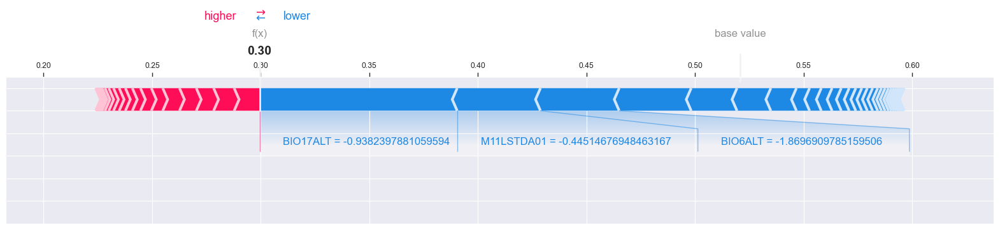

CPU times: total: 422 ms
Wall time: 509 ms


In [45]:
%%time

print("Prediction at first row: ", y_test_pred[0], "Mean prediction from X_test:", y_test_pred.mean())
shap.plots.force(explainer.expected_value, shap_values_df.to_numpy()[0,:], X_test_scaled_df.iloc[0][relevant_features], matplotlib = True)

### Test Data: Force Plot of the first y_test prediction using the non-scaled X_test features

Prediction at first row:  0.29948289970224046 Mean prediction from X_test: 0.5158702878399828


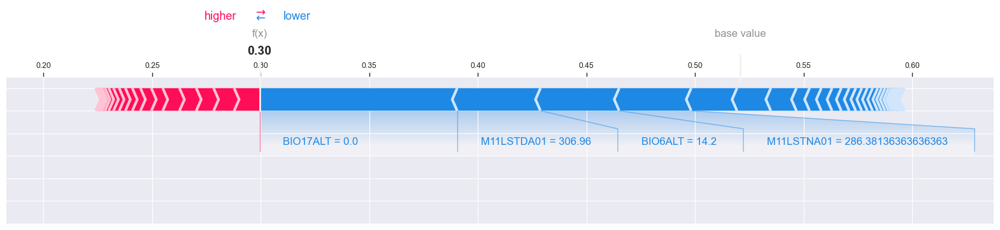

CPU times: total: 359 ms
Wall time: 350 ms


In [46]:
%%time

print("Prediction at first row: ", y_test_pred[0], "Mean prediction from X_test:", y_test_pred.mean())
shap.plots.force(explainer.expected_value, shap_values_df.to_numpy()[0,:], X_test.iloc[0][relevant_features], matplotlib = True)

NB: IF THE TRAINING FEATURES USED IN THE ML MODEL TRAINING WERE SCALED, THE SHAP VALUES MUST ALSO BE CALCULATED USING SCALED FEATURES AS WELL. THIS WAY, THE FORCE PLOT IS ABLE TO CALCULATE THE CORRECT PREDICTED VALUE FROM THE SHAP VALUES. 

WHEN SCALED FEATURES ARE USED IN A FORCE PLOT, THE FEATURE VALUES IN THE PLOT WOULD ALSO BE SCALED BUT THE PREDICTED VALUE STAYS THE SAME, WHICH IS QUITE DIFFICULT TO INTERPRET WHICH FEATURE VALUES ARE PLAYING THE MAJOR ROLE.

SO IT IS ADVISABLE TO USE RAW FEATURE VALUES IN FORCE PLOTS AND OTHER PLOTS IN ORDER TO UNDERSTAND HOW THE RAW VALUES INFLUENCED THE PREDICTION.

### Grid1km: Calculate Local Interpretability ~ 4hrs !!!

In [8]:
%%time

# Scaling the grid1km features because the model was trained on scaled training features
scaler = model[0]

grid1km_subset = grid1km[grid1km['pred_trend'].isna() == False].copy()
grid1km_subset = grid1km_subset.reset_index(drop=True) # necessary to allow easy merging with the shap results

X_grid_scaled    = scaler.fit_transform(grid1km_subset[relevant_features])
X_grid_scaled_df = pd.DataFrame(X_grid_scaled, columns = relevant_features)

[shap_values_df, shap_values_perc_df, local_vimp] = xai.calc_local_interpretability(explainer, X_grid_scaled_df)

#### Notes
# ASUS Computer
# Time taken for SHAP: 12hrs
# Time taken for FastTreeSHAP: 

# Lenovo Computer
# Time taken for SHAP:5hrs
# Time taken for FastTreeSHAP: 2hrs 17min

# Server Computer
# Time taken for SHAP:
# Time taken for FastTreeSHAP: 3h 54min 46s

In [48]:
# SHAP calculates a value even if there are NAs in the dataset which would influence the local interpretability for records that contain NAs
(shap_values_df.isna() == True).sum(axis=1).sum()

0

### Validate SHAP calculations

In [49]:
print("y_grid_pred", np.array(grid1km_subset['pred_trend'][:5]))

print("shap_calculated", np.array(explainer.expected_value[0] + shap_values_df.sum(axis=1))[:5])

a = grid1km_subset['pred_trend']
b = explainer.expected_value[0] + shap_values_df.sum(axis=1)
c = round(np.corrcoef(a,b)[0,1], 2)
rmse = math.sqrt(mean_squared_error(a,b))

print ("corr: ", c, "rmse: ", rmse)


y_grid_pred [0.26667884 0.24482397 0.26034082 0.21434457 0.24570787]
shap_calculated [0.26226498 0.25192509 0.25461985 0.24695203 0.24469663]
corr:  0.91 rmse:  0.0653323434702929


In [50]:
shap_values_df

,SRTM_Aspect_shap,SRTM_Eastness_shap,SRTM_Elevation_shap,SRTM_GaussianCurvature_shap,SRTM_Hillshade_shap,SRTM_HorizontalCurvature_shap,SRTM_MaximalCurvature_shap,SRTM_MeanCurvature_shap,SRTM_Northness_shap,M09B4A01_shap,...,M17NPP2010_shap,M17NPP2001_shap,BIO11ALT_shap,BIO2ALT_shap,BIO6ALT_shap,BIO9ALT_shap,BIO14ALT_shap,BIO17ALT_shap,BIO18ALT_shap,BIO19ALT_shap
0,0.008954,-0.001148,0.016246,0.001073,0.008127,-0.002205,0.000029,0.033525,0.001645,-0.024293,...,0.002541,-0.000417,-0.002271,0.000809,-0.038179,-0.000733,-0.002767,-0.095120,0.001804,-0.017776
1,0.007802,-0.001461,0.003359,0.007986,0.010219,-0.000300,-0.000849,0.009023,0.001136,-0.028712,...,0.003071,-0.000461,-0.002137,0.001128,-0.034668,0.000271,-0.002834,-0.103015,0.001772,-0.019445
2,0.009770,-0.000792,0.003275,0.000558,0.008582,0.001374,-0.000343,0.009747,0.001007,-0.026909,...,0.003235,-0.000418,-0.002761,0.000789,-0.034369,-0.000195,-0.002760,-0.099510,0.002558,-0.018102
3,0.007259,-0.001374,0.002284,-0.000039,0.009296,0.000378,-0.000752,0.008209,0.002004,-0.026857,...,0.003404,-0.000411,-0.002285,0.001503,-0.033872,-0.000278,-0.002681,-0.098957,0.002098,-0.018510
4,0.006922,-0.001513,-0.001945,-0.000025,0.012120,-0.000124,-0.000879,0.007208,0.002406,-0.026152,...,0.004118,-0.000492,-0.002275,0.001358,-0.032568,-0.000816,-0.002709,-0.100371,0.002926,-0.018745
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269278,-0.001474,0.000578,0.005006,-0.002274,0.009159,-0.002055,0.001741,0.009724,0.010072,0.021658,...,-0.000133,0.001174,-0.000279,-0.001014,0.002837,-0.001911,0.010436,0.100030,0.002804,0.016344
269279,-0.001434,0.000627,0.005432,-0.003306,0.009616,-0.002671,0.003383,0.011060,0.009562,0.019599,...,-0.000047,0.001164,-0.000298,-0.002711,0.003093,-0.001516,0.010487,0.095108,0.002891,0.016229
269280,-0.002153,0.000122,0.005842,-0.002624,0.009072,-0.002285,0.002132,0.013029,0.009522,0.015398,...,0.000163,0.000638,0.000281,-0.004123,0.002511,-0.001750,0.009843,0.094284,0.002947,0.016428
269281,-0.002279,0.000536,0.005659,-0.003428,0.009585,-0.002661,0.002504,0.012430,0.008835,0.019458,...,-0.000199,0.000608,0.000319,-0.003737,0.002323,-0.001413,0.009297,0.088719,0.003088,0.016358


In [51]:
shap_values_perc_df

,SRTM_Aspect_shap_perc,SRTM_Eastness_shap_perc,SRTM_Elevation_shap_perc,SRTM_GaussianCurvature_shap_perc,SRTM_Hillshade_shap_perc,SRTM_HorizontalCurvature_shap_perc,SRTM_MaximalCurvature_shap_perc,SRTM_MeanCurvature_shap_perc,SRTM_Northness_shap_perc,M09B4A01_shap_perc,...,M17NPP2010_shap_perc,M17NPP2001_shap_perc,BIO11ALT_shap_perc,BIO2ALT_shap_perc,BIO6ALT_shap_perc,BIO9ALT_shap_perc,BIO14ALT_shap_perc,BIO17ALT_shap_perc,BIO18ALT_shap_perc,BIO19ALT_shap_perc
0,1.8,-0.2,3.3,0.2,1.6,-0.4,0.0,6.7,0.3,-4.9,...,0.5,-0.1,-0.5,0.2,-7.7,-0.1,-0.6,-19.1,0.4,-3.6
1,1.7,-0.3,0.7,1.7,2.2,-0.1,-0.2,1.9,0.2,-6.2,...,0.7,-0.1,-0.5,0.2,-7.5,0.1,-0.6,-22.3,0.4,-4.2
2,2.1,-0.2,0.7,0.1,1.9,0.3,-0.1,2.1,0.2,-5.9,...,0.7,-0.1,-0.6,0.2,-7.5,-0.0,-0.6,-21.9,0.6,-4.0
3,1.6,-0.3,0.5,-0.0,2.1,0.1,-0.2,1.8,0.4,-5.9,...,0.8,-0.1,-0.5,0.3,-7.5,-0.1,-0.6,-21.9,0.5,-4.1
4,1.6,-0.4,-0.5,-0.0,2.8,-0.0,-0.2,1.7,0.6,-6.1,...,1.0,-0.1,-0.5,0.3,-7.6,-0.2,-0.6,-23.3,0.7,-4.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
269278,-0.2,0.1,0.8,-0.4,1.5,-0.3,0.3,1.6,1.7,3.6,...,-0.0,0.2,-0.0,-0.2,0.5,-0.3,1.7,16.6,0.5,2.7
269279,-0.2,0.1,0.9,-0.6,1.6,-0.4,0.6,1.9,1.6,3.3,...,-0.0,0.2,-0.1,-0.5,0.5,-0.3,1.8,16.0,0.5,2.7
269280,-0.4,0.0,1.0,-0.4,1.5,-0.4,0.4,2.2,1.6,2.6,...,0.0,0.1,0.0,-0.7,0.4,-0.3,1.7,16.1,0.5,2.8
269281,-0.4,0.1,1.0,-0.6,1.6,-0.4,0.4,2.1,1.5,3.3,...,-0.0,0.1,0.1,-0.6,0.4,-0.2,1.6,14.9,0.5,2.7


In [52]:
local_vimp[:10]

['BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT',
 'BIO17ALT']

In [53]:
# grid1km_subset.loc[:, ["pk"]]

### Grid1km: Merge Local Interpretability results with the original dataset. Save this dataset !!!

merging the subset

In [54]:
%%time

# First merge the results with the subset that was used as input data to restore the pk index
grid1km_subset_shap = pd.concat([grid1km_subset.loc[:, ["pk"]], shap_values_df, shap_values_perc_df], axis=1)

# Add the local predominant predictor as a column
grid1km_subset_shap['local_vimp'] = local_vimp 

# Merge with the original grid data
grid1km           = read_dataframe("saved/data/grid1km_pred.gpkg", layer= "grid1km_pred")
grid1km_pred_shap = pd.merge(grid1km, grid1km_subset_shap, "left", "pk")

# Set No Data values
grid1km_pred_shap['local_vimp'][grid1km_pred_shap['local_vimp'].isna()] = "No Data"

with open("saved/data/grid1km_pred_shap.pickle", 'wb') as f:
     pickle.dump(grid1km_pred_shap, f)

<timed exec>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



CPU times: total: 40.7 s
Wall time: 41.1 s


merging the full grid

In [55]:
# %%time

# grid1km           = read_dataframe("saved/data/grid1km_pred.gpkg", layer= "grid1km_pred")
# grid1km_pred_shap = pd.concat([grid1km, shap_values_df, shap_values_perc_df], axis=1)

# # Add the identified column name to the row under a new column local_vimp
# grid1km_pred_shap['local_vimp'] = local_vimp 

# # Set No Data values
# grid1km_pred_shap['local_vimp'][grid1km_pred_shap['pred_trend'].isna()] = "No Data"

# with open("saved/data/grid1km_pred_shap.pickle", 'wb') as f:
#      pickle.dump(grid1km_pred_shap, f)

### Grid1km: Review the unique local predominant predictors

In [56]:
%%time

grid1km_pred_shap['local_vimp'].unique()

CPU times: total: 15.6 ms
Wall time: 10.4 ms


array(['BIO17ALT', 'No Data', 'M11LSTDA03', 'M13RB3A08', 'M11LSTDA01',
       'M11LSTDA05', 'BIO19ALT', 'M13RB3A07', 'BIO6ALT', 'M13RB2A09',
       'M09B4A01', 'SRTM_Hillshade', 'M11LSTDA06', 'BIO14ALT'],
      dtype=object)

### Grid1km: Force Plot on the first prediction on the grid

In [14]:
%%time

print("Explainer expected value: ", explainer.expected_value[0])

print("Manual calculation of explainer prediction from SHAP values: ", explainer.expected_value[0] + shap_values_df.iloc[0,:].sum()) 

Explainer expected value:  0.5208619101123595
Manual calculation of explainer prediction from SHAP values:  0.2622649812734076
CPU times: total: 0 ns
Wall time: 0 ns


Prediction at first row:  0.26667883895131095 Mean prediction from X_test: 0.5158702878399828


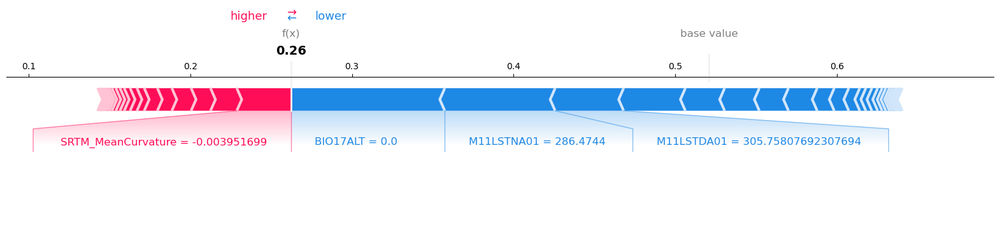

CPU times: total: 953 ms
Wall time: 965 ms


In [16]:
%%time

print("Prediction at first row: ", grid1km_subset['pred_trend'][0], "Mean prediction from X_test:", model.predict(X_test).mean())
shap.plots.force(explainer.expected_value[0], shap_values_df.to_numpy()[0,:], grid1km_subset.iloc[0][relevant_features], matplotlib = True, show= False)
plt.savefig("saved/plots/shap_force_plot.png", dpi=300, bbox_inches='tight')
plt.show()


In [19]:
shap_values_df.shape

(273110, 51)

### Grid1km: Summary Plot

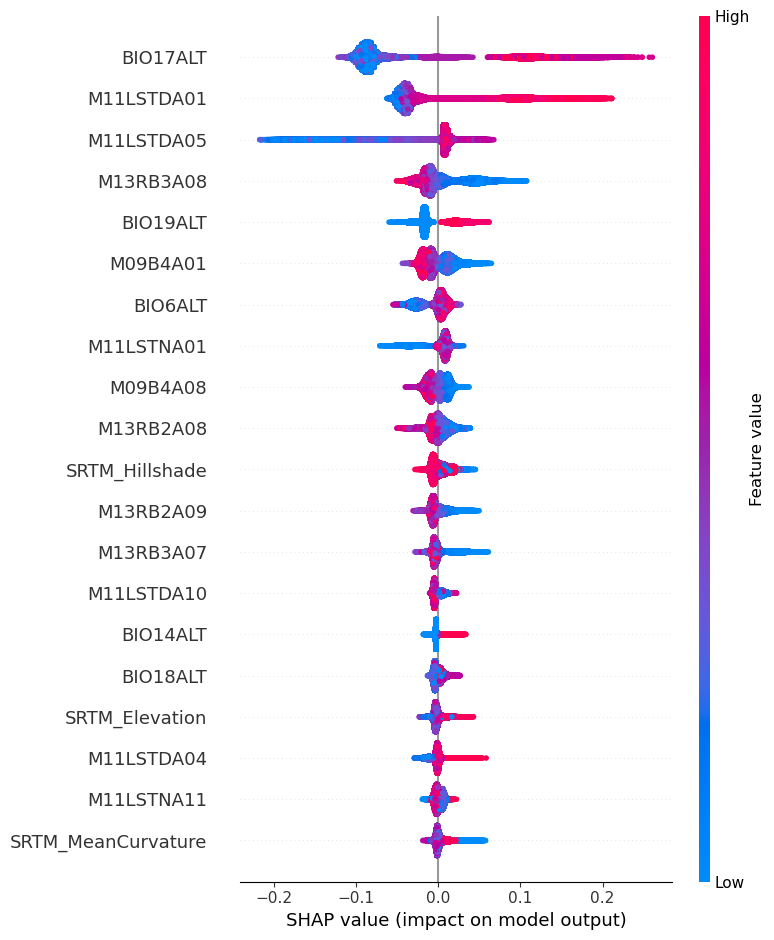

CPU times: total: 1min 3s
Wall time: 1min 3s


In [27]:
%%time

shap.summary_plot(shap_values_df.to_numpy(), grid1km_subset[relevant_features], show= False)
plt.savefig("saved/plots/shap_summary_plot.png", dpi=300, bbox_inches='tight')
plt.show()

### Grid1km: Local Interpretability maps

CPU times: total: 1min 16s
Wall time: 1min 19s


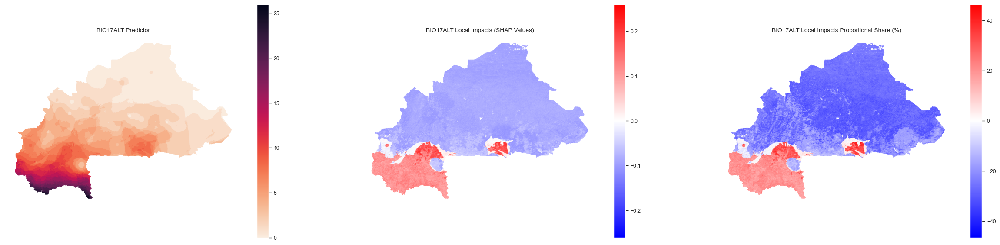

In [314]:
%%time

cmap_continuous = sns.color_palette("rocket_r", as_cmap=True)
cmap_diverging = sns.color_palette("bwr", as_cmap=True)

# Getting the max values to center the legend on 0 for diverging color palette
vmax_shap = max( abs(grid1km_pred_shap['BIO17ALT_shap']) )
vmax_shap_perc = max( abs(grid1km_pred_shap['BIO17ALT_shap_perc']))

fig, axes = plt.subplots(nrows= 1, ncols= 3, figsize= (30, 7))
grid1km_pred_shap.plot(column= "BIO17ALT", legend= True, cmap= cmap_continuous, markersize= 0.1, ax= axes[0])
axes[0].axis('off')
axes[0].set_title("BIO17ALT Predictor")

grid1km_pred_shap.plot(column= "BIO17ALT_shap", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[1], vmin=-1*vmax_shap, vmax=vmax_shap)
axes[1].axis('off')
axes[1].set_title("BIO17ALT Local Impacts (SHAP Values)")

grid1km_pred_shap.plot(column= "BIO17ALT_shap_perc", legend= True, cmap=cmap_diverging, markersize= 0.1, ax= axes[2], vmin=-1*vmax_shap_perc, vmax=vmax_shap_perc)
axes[2].axis('off')
axes[2].set_title("BIO17ALT Local Impacts Proportional Share (%)")

# plt.savefig("saved/plots/BIO17ALT.png", dpi=300, bbox_inches= "tight")

CPU times: total: 1min 14s
Wall time: 1min 16s


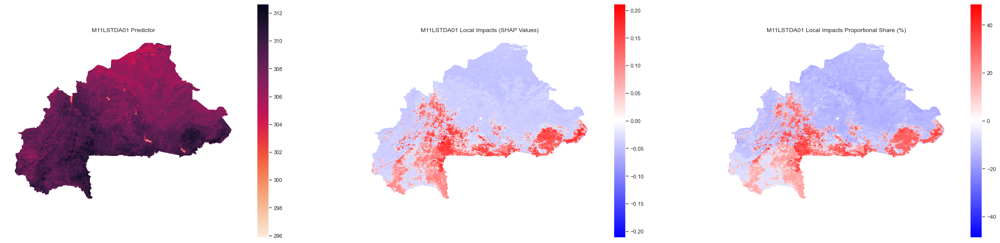

In [313]:
%%time

# Getting the max values to center the legend on 0 for diverging color palette
vmax_shap = max( abs(grid1km_pred_shap['M11LSTDA01_shap']) )
vmax_shap_perc = max( abs(grid1km_pred_shap['M11LSTDA01_shap_perc']))

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 7))
grid1km_pred_shap.plot(column= "M11LSTDA01", legend= True, cmap= cmap_continuous, markersize= 0.1, ax= axes[0])
axes[0].axis('off')
axes[0].set_title("M11LSTDA01 Predictor")

grid1km_pred_shap.plot(column= "M11LSTDA01_shap", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[1], vmin=-1*vmax_shap, vmax=vmax_shap)
axes[1].axis('off')
axes[1].set_title("M11LSTDA01 Local Impacts (SHAP Values)")

grid1km_pred_shap.plot(column= "M11LSTDA01_shap_perc", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[2], vmin=-1*vmax_shap_perc, vmax=vmax_shap_perc)
axes[2].axis('off')
axes[2].set_title("M11LSTDA01 Local Impacts Proportional Share (%)")

# plt.savefig("saved/plots/M11LSTDA01.png", dpi=300, bbox_inches= "tight")


CPU times: total: 1min 14s
Wall time: 1min 15s


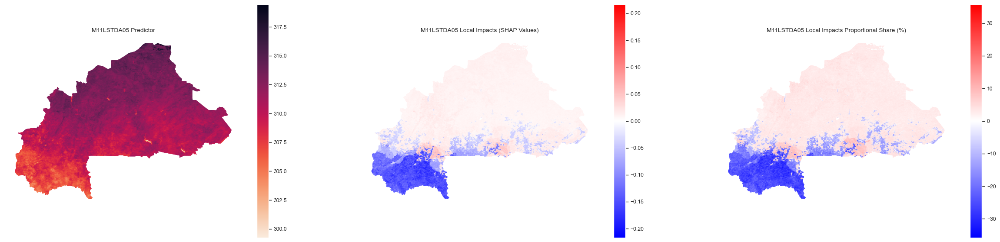

In [312]:
%%time

# Getting the max values to center the legend on 0 for diverging color palette
vmax_shap = max( abs(grid1km_pred_shap['M11LSTDA05_shap']) )
vmax_shap_perc = max( abs(grid1km_pred_shap['M11LSTDA05_shap_perc']))

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 7))
grid1km_pred_shap.plot(column= "M11LSTDA05", legend= True, cmap= cmap_continuous, markersize= 0.1, ax= axes[0])
axes[0].axis('off')
axes[0].set_title("M11LSTDA05 Predictor")

grid1km_pred_shap.plot(column= "M11LSTDA05_shap", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[1], vmin=-1*vmax_shap, vmax=vmax_shap)
axes[1].axis('off')
axes[1].set_title("M11LSTDA05 Local Impacts (SHAP Values)")

grid1km_pred_shap.plot(column= "M11LSTDA05_shap_perc", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[2], vmin=-1*vmax_shap_perc, vmax=vmax_shap_perc)
axes[2].axis('off')
axes[2].set_title("M11LSTDA05 Local Impacts Proportional Share (%)")

# plt.savefig("saved/plots/M11LSTDA05.png", dpi=300, bbox_inches= "tight")


CPU times: total: 1min 14s
Wall time: 1min 14s


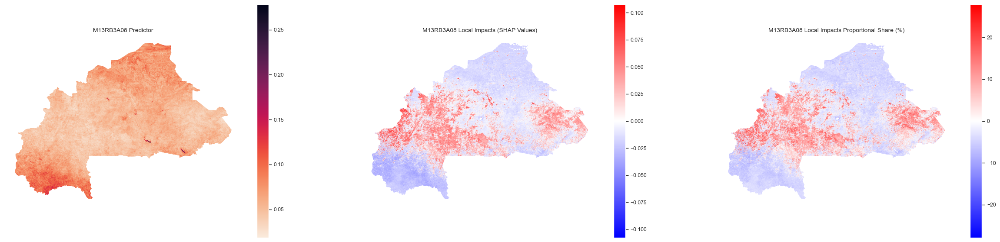

In [311]:
%%time

# Getting the max values to center the legend on 0 for diverging color palette
vmax_shap = max( abs(grid1km_pred_shap['M13RB3A08_shap']) )
vmax_shap_perc = max( abs(grid1km_pred_shap['M13RB3A08_shap_perc']))

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 7))
grid1km_pred_shap.plot(column= "M13RB3A08", legend= True, cmap= cmap_continuous, markersize= 0.1, ax= axes[0])
axes[0].axis('off')
axes[0].set_title("M13RB3A08 Predictor")

grid1km_pred_shap.plot(column= "M13RB3A08_shap", legend= True, cmap=cmap_diverging, markersize= 0.1, ax= axes[1], vmin=-1*vmax_shap, vmax=vmax_shap)
axes[1].axis('off')
axes[1].set_title("M13RB3A08 Local Impacts (SHAP Values)")

grid1km_pred_shap.plot(column= "M13RB3A08_shap_perc", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[2], vmin=-1*vmax_shap_perc, vmax=vmax_shap_perc)
axes[2].axis('off')
axes[2].set_title("M13RB3A08 Local Impacts Proportional Share (%)")

# plt.savefig("saved/plots/M13RB3A08.png", dpi=300, bbox_inches= "tight")


CPU times: total: 1min 10s
Wall time: 1min 10s


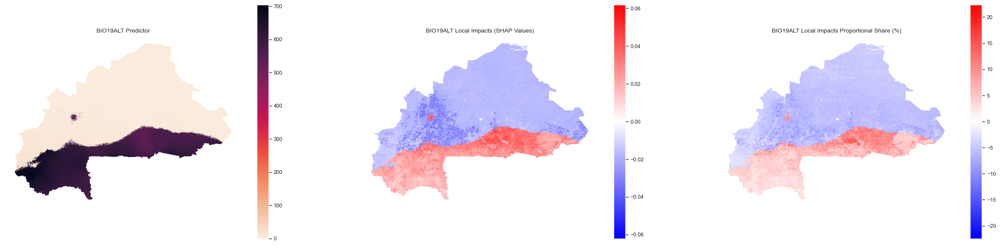

In [310]:
%%time

# Getting the max values to center the legend on 0 for diverging color palette
vmax_shap = max( abs(grid1km_pred_shap['BIO19ALT_shap']) )
vmax_shap_perc = max( abs(grid1km_pred_shap['BIO19ALT_shap_perc']))

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 7))
grid1km_pred_shap.plot(column= "BIO19ALT", legend= True, cmap= cmap_continuous, markersize= 0.1, ax= axes[0])
axes[0].axis('off')
axes[0].set_title("BIO19ALT Predictor")

grid1km_pred_shap.plot(column= "BIO19ALT_shap", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[1], vmin=-1*vmax_shap, vmax=vmax_shap)
axes[1].axis('off')
axes[1].set_title("BIO19ALT Local Impacts (SHAP Values)")

grid1km_pred_shap.plot(column= "BIO19ALT_shap_perc", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[2], vmin=-1*vmax_shap_perc, vmax=vmax_shap_perc)
axes[2].axis('off')
axes[2].set_title("BIO19ALT Local Impacts Proportional Share (%)")

# plt.savefig("saved/plots/BIO19ALT.png", dpi=300, bbox_inches= "tight")


CPU times: total: 1min 10s
Wall time: 1min 10s


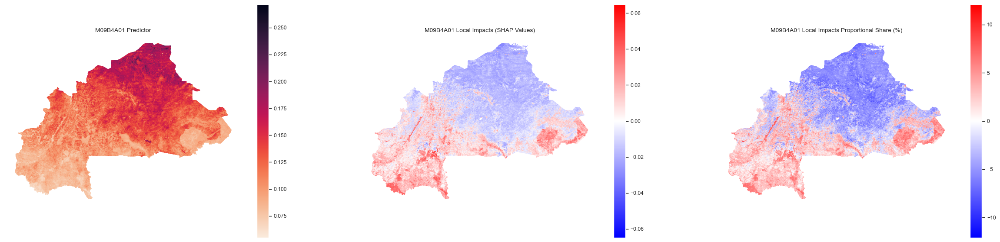

In [309]:
%%time

# Getting the max values to center the legend on 0 for diverging color palette
vmax_shap = max( abs(grid1km_pred_shap['M09B4A01_shap']) )
vmax_shap_perc = max( abs(grid1km_pred_shap['M09B4A01_shap_perc']))

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 7))
grid1km_pred_shap.plot(column= "M09B4A01", legend= True, cmap= cmap_continuous, markersize= 0.1, ax= axes[0])
axes[0].axis('off')
axes[0].set_title("M09B4A01 Predictor")

grid1km_pred_shap.plot(column= "M09B4A01_shap", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[1], vmin=-1*vmax_shap, vmax=vmax_shap)
axes[1].axis('off')
axes[1].set_title("M09B4A01 Local Impacts (SHAP Values)")

grid1km_pred_shap.plot(column= "M09B4A01_shap_perc", legend= True, cmap= cmap_diverging, markersize= 0.1, ax= axes[2], vmin=-1*vmax_shap_perc, vmax=vmax_shap_perc)
axes[2].axis('off')
axes[2].set_title("M09B4A01 Local Impacts Proportional Share (%)")

# plt.savefig("saved/plots/M09B4A01.png", dpi=300, bbox_inches= "tight")

### Testing multiple comparison plot

Exception ignored in: <function BaseGeometry.__del__ at 0x000002F7A9F29700>
Traceback (most recent call last):
  File "c:\Miniconda3\envs\geoai\lib\site-packages\shapely\geometry\base.py", line 209, in __del__
    self._empty(val=None)
  File "c:\Miniconda3\envs\geoai\lib\site-packages\shapely\geometry\base.py", line 194, in _empty
    self._lgeos.GEOSGeom_destroy(self.__geom__)
KeyboardInterrupt: 


CPU times: total: 4min 13s
Wall time: 4min 13s


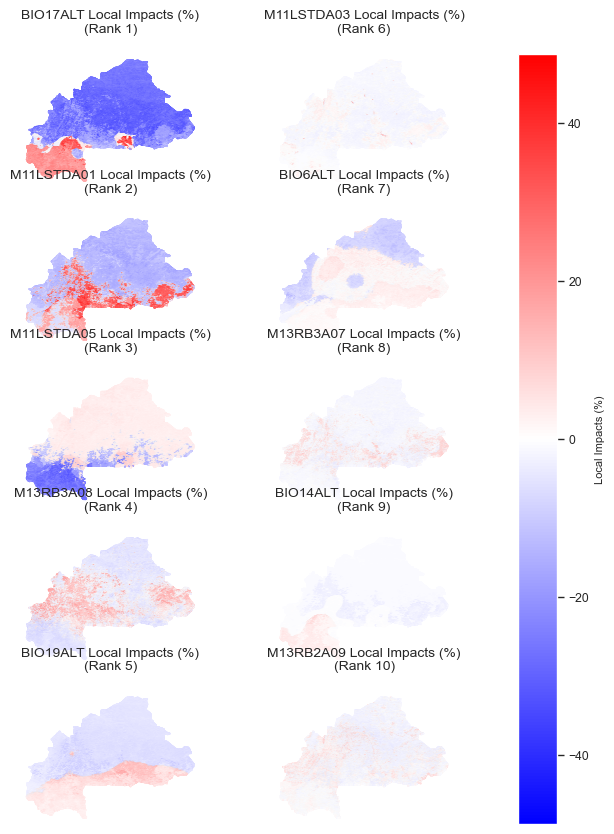

In [322]:
%%time

fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(8, 10))
# plt.tight_layout()

for ax in axes.flat:
    ax.axis('off')

# This max value is to ensure we use the same scale for all plots being compared
vmax_shap_perc = max( abs( 
                pd.concat([
                grid1km_pred_shap['BIO17ALT_shap_perc'],
                grid1km_pred_shap['M11LSTDA01_shap_perc'],
                grid1km_pred_shap['M11LSTDA05_shap_perc'],
                grid1km_pred_shap['M13RB3A08_shap_perc'],
                grid1km_pred_shap['BIO19ALT_shap_perc'],
                grid1km_pred_shap['M11LSTDA03_shap_perc'],
                grid1km_pred_shap['BIO6ALT_shap_perc'],
                grid1km_pred_shap['M13RB3A07_shap_perc'],
                grid1km_pred_shap['BIO14ALT_shap_perc'],
                grid1km_pred_shap['M13RB2A09_shap_perc']])
        ) 
)



grid1km_pred_shap.plot(column= "BIO17ALT_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[0,0], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[0,0].set_title("BIO17ALT Local Impacts (%)\n(Rank 1)")

grid1km_pred_shap.plot(column= "M11LSTDA01_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[1,0], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[1,0].set_title("M11LSTDA01 Local Impacts (%)\n(Rank 2)")

grid1km_pred_shap.plot(column= "M11LSTDA05_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[2,0], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[2,0].set_title("M11LSTDA05 Local Impacts (%)\n(Rank 3)")

grid1km_pred_shap.plot(column= "M13RB3A08_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[3,0], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[3,0].set_title("M13RB3A08 Local Impacts (%)\n(Rank 4)")

grid1km_pred_shap.plot(column= "BIO19ALT_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[4,0], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[4,0].set_title("BIO19ALT Local Impacts (%)\n(Rank 5)")

grid1km_pred_shap.plot(column= "M11LSTDA03_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[0,1], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[0,1].set_title("M11LSTDA03 Local Impacts (%)\n(Rank 6)")

grid1km_pred_shap.plot(column= "BIO6ALT_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[1,1], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[1,1].set_title("BIO6ALT Local Impacts (%)\n(Rank 7)")

grid1km_pred_shap.plot(column= "M13RB3A07_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[2,1], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[2,1].set_title("M13RB3A07 Local Impacts (%)\n(Rank 8)")

grid1km_pred_shap.plot(column= "BIO14ALT_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[3,1], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[3,1].set_title("BIO14ALT Local Impacts (%)\n(Rank 9)")

grid1km_pred_shap.plot(column= "M13RB2A09_shap_perc", cmap= cmap_diverging, markersize= 0.1, ax= axes[4,1], vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc)
axes[4,1].set_title("M13RB2A09 Local Impacts (%)\n(Rank 10)")


#---- Add a single legend

# Create a Normalize object that does not normalize the data
norm = mcolors.Normalize(vmin= -1*vmax_shap_perc, vmax= vmax_shap_perc )

# Create a ScalarMappable object
sm = plt.cm.ScalarMappable(cmap=cmap_diverging, norm=norm)
sm.set_array([])  # Dummy array for ScalarMappable, can be empty

cbar = fig.colorbar(sm, ax=axes, orientation='vertical', pad=0.1)
cbar.set_label('Local Impacts (%)')

# Adjust the spacing between subplots
# fig.subplots_adjust(wspace=0, hspace=0.2)  # Increase spacing


# plt.show()

### Matplotlib single maps

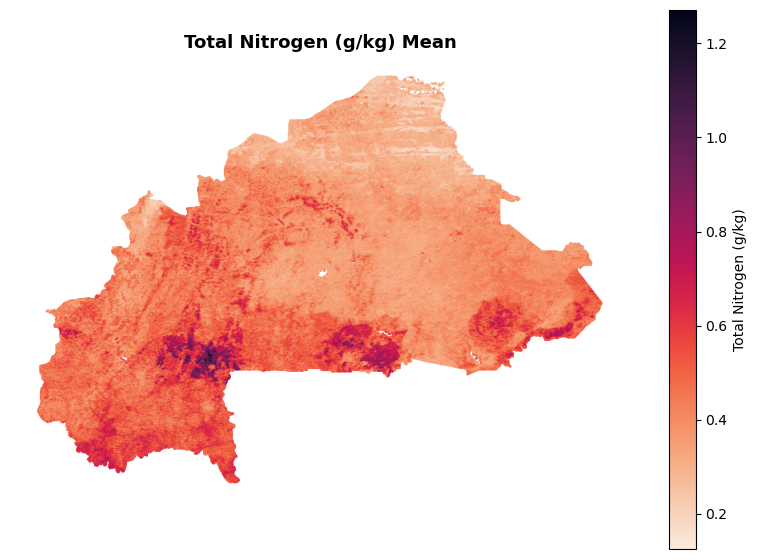

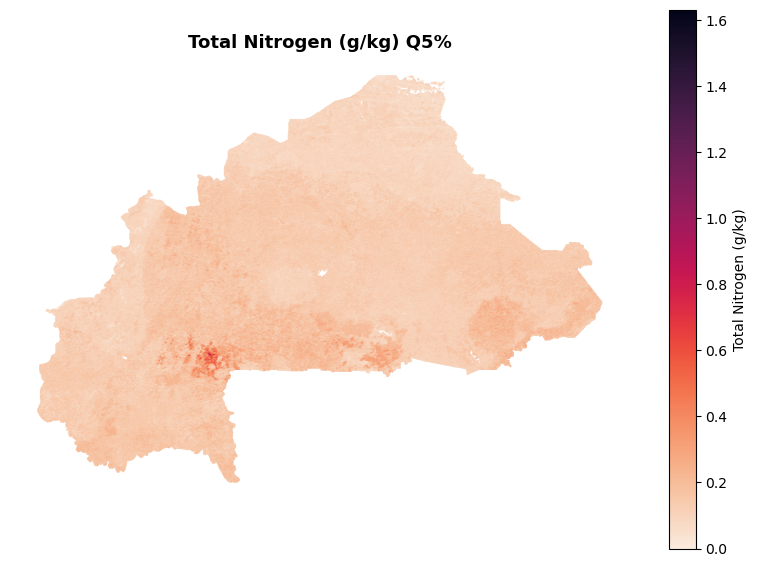

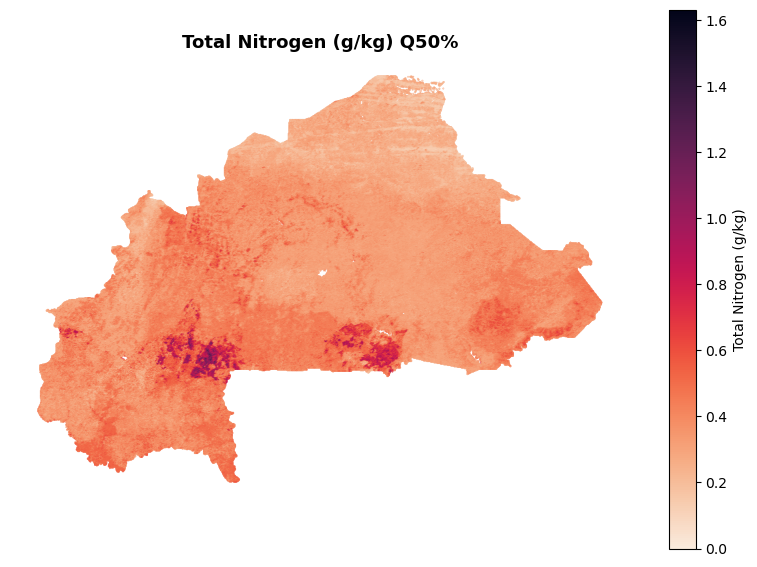

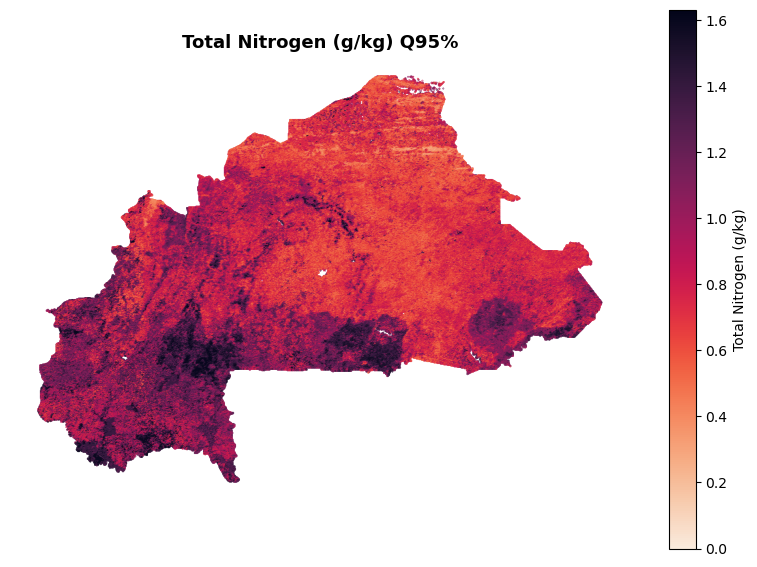

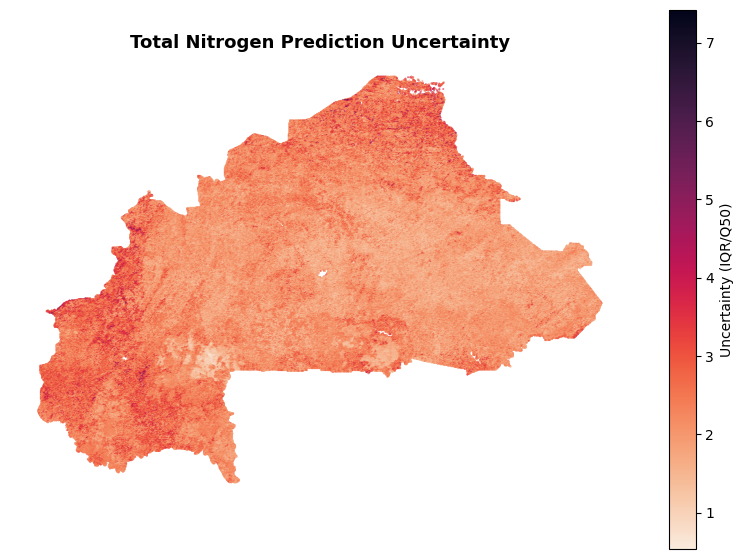

...

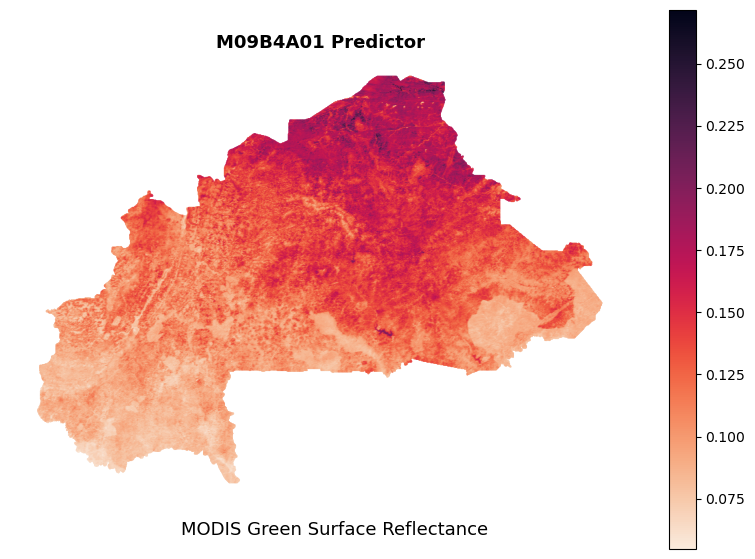

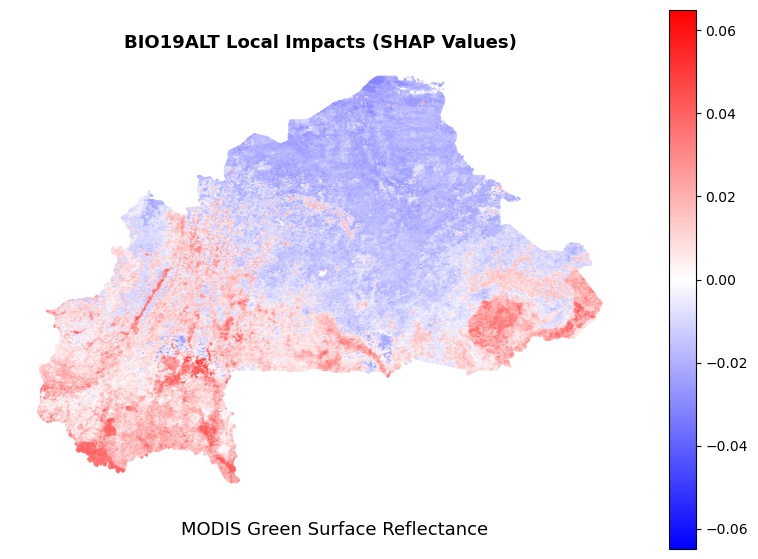

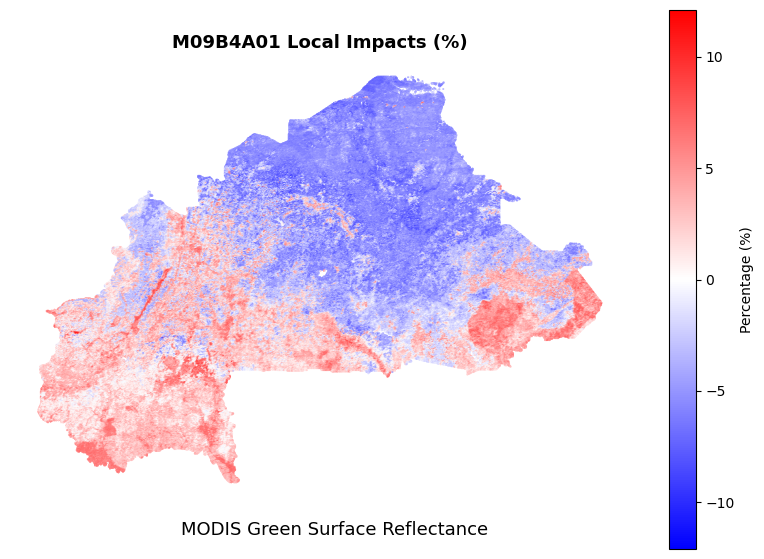

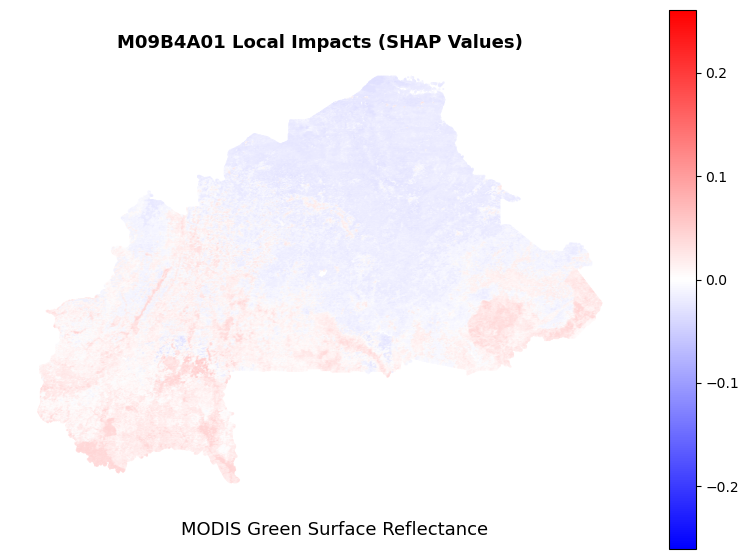

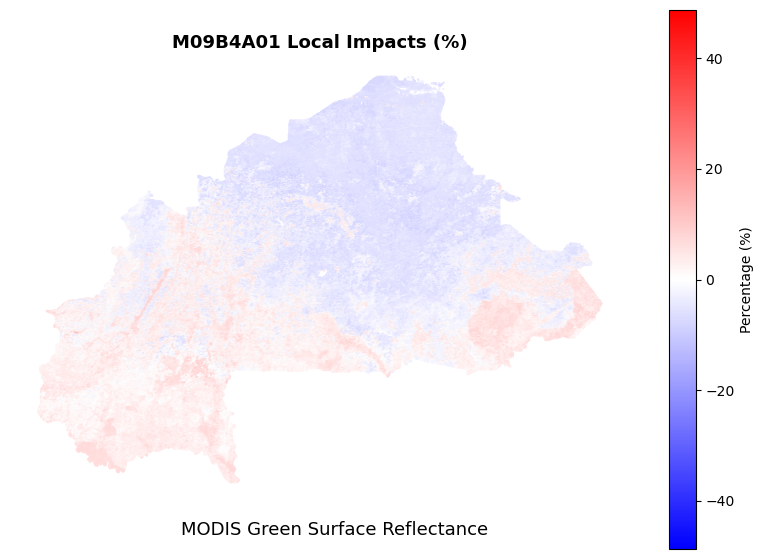

In [64]:
# This max value is to ensure we use the same scale for all plots being compared
vmax_shap = max( abs( 
                pd.concat([
                grid1km_pred_shap['BIO17ALT_shap'],
                grid1km_pred_shap['M11LSTDA01_shap'],
                grid1km_pred_shap['M11LSTDA05_shap'],
                grid1km_pred_shap['M13RB3A08_shap'],
                grid1km_pred_shap['BIO19ALT_shap'],
                grid1km_pred_shap['M11LSTDA03_shap'],
                grid1km_pred_shap['BIO6ALT_shap'],
                grid1km_pred_shap['M13RB3A07_shap'],
                grid1km_pred_shap['BIO14ALT_shap'],
                grid1km_pred_shap['M13RB2A09_shap']])
        ) 
)

# This max value is to ensure we use the same scale for all plots being compared
vmax_shap_perc = max( abs( 
                pd.concat([
                grid1km_pred_shap['BIO17ALT_shap_perc'],
                grid1km_pred_shap['M11LSTDA01_shap_perc'],
                grid1km_pred_shap['M11LSTDA05_shap_perc'],
                grid1km_pred_shap['M13RB3A08_shap_perc'],
                grid1km_pred_shap['BIO19ALT_shap_perc'],
                grid1km_pred_shap['M11LSTDA03_shap_perc'],
                grid1km_pred_shap['BIO6ALT_shap_perc'],
                grid1km_pred_shap['M13RB3A07_shap_perc'],
                grid1km_pred_shap['BIO14ALT_shap_perc'],
                grid1km_pred_shap['M13RB2A09_shap_perc']])
        ) 
)



map_specs = {


				#--- Map 1

				# standalone visualization
				1:  { 'col_name': 'pred_trend',
								'title':'Total Nitrogen (g/kg) Mean',
								'subtitle':'',
								'legend_label': 'Total Nitrogen (g/kg)', 
								'vmin':None, 
								'vmax':None,
								'cmap_type':'continuous',
								'save_fn':'map1_TotalN_pred_mean.png'},
								
				#--- Map 2	

				# comparison visualization	
				2:  {'col_name': 'pred_q5',
							'title':'Total Nitrogen (g/kg) Q5%',
							'subtitle':'',
							'legend_label': 'Total Nitrogen (g/kg)', 
							'vmin':min(grid1km_pred_shap['pred_q5']), 
							'vmax':max(grid1km_pred_shap['pred_q95']),
							'cmap_type':'continuous',
							'save_fn':'map2_TotalN_pred_q5.png'},
				
				# comparison visualization			
				3: {'col_name': 'pred_q50',
					'title':'Total Nitrogen (g/kg) Q50%',
							'subtitle':'',
							'legend_label': 'Total Nitrogen (g/kg)', 
							'vmin':min(grid1km_pred_shap['pred_q5']), 
							'vmax':max(grid1km_pred_shap['pred_q95']),
							'cmap_type':'continuous',
							'save_fn':'map2_TotalN_pred_q50.png'},
				
				# comparison visualization				
				4: {'col_name': 'pred_q95',
					'title':'Total Nitrogen (g/kg) Q95%',
							'subtitle':'',
							'legend_label': 'Total Nitrogen (g/kg)', 
							'vmin':min(grid1km_pred_shap['pred_q5']), 
							'vmax':max(grid1km_pred_shap['pred_q95']),
							'cmap_type':'continuous',
							'save_fn':'map2_TotalN_pred_q95.png'},
             
			 	#--- Map 3

				# standalone visualization	
			    5: {'col_name': 'uncertainty',
					'title':'Total Nitrogen Prediction Uncertainty',
								'subtitle':'',
								'legend_label': 'Uncertainty (IQR/Q50)', 
								'vmin':None, 
								'vmax':None,
								'cmap_type':'continuous',
								'save_fn':'map3_TotalN_pred_uncertainty.png'},
							

				#--- Map 4

				# standalone visualization	
				6: {'col_name': 'BIO17ALT',
					'title':'BIO17ALT Predictor',
							'subtitle':'Precipitation of driest quarter',
							'legend_label': 'Precipitation (mm)', 
							'vmin':None, 
							'vmax':None,
							'cmap_type':'continuous',
							'save_fn':'map4_BIO17ALT_predictor.png'},

				# standalone visualization	
				7: {'col_name': 'BIO17ALT_shap',
					'title':'BIO17ALT Local Impacts (SHAP Values)',
								'subtitle':'Precipitation of driest quarter',
								'legend_label': None, 
								'vmin':-1* max(abs(grid1km_pred_shap['BIO17ALT_shap'])), 
								'vmax': max(abs(grid1km_pred_shap['BIO17ALT_shap'])),
								'cmap_type':'diverging',
								'save_fn':'map4_BIO17ALT_shap.png'},

				# standalone visualization	
				8: {'col_name': 'BIO17ALT_shap_perc',
					'title':'BIO17ALT Local Impacts (%)',
										'subtitle':'Precipitation of driest quarter',
										'legend_label': 'Percentage (%)', 
										'vmin':-1* max(abs(grid1km_pred_shap['BIO17ALT_shap_perc'])), 
										'vmax': max(abs(grid1km_pred_shap['BIO17ALT_shap_perc'])),
										'cmap_type':'diverging',
										'save_fn':'map4_BIO17ALT_shap_perc.png'},

				# comparison visualization	
				9: {'col_name': 'BIO17ALT_shap',
					'title':'BIO17ALT Local Impacts (SHAP Values)',
								'subtitle':'Precipitation of driest quarter',
								'legend_label': None, 
								'vmin': -1*vmax_shap, 
								'vmax': vmax_shap,
								'cmap_type':'diverging',
								'save_fn':'map4_BIO17ALT_shap_compare.png'},					

				# comparison visualization	
				10: {'col_name': 'BIO17ALT_shap_perc',
					'title':'BIO17ALT Local Impacts (%)',
									'subtitle':'Precipitation of driest quarter',
									'legend_label': 'Percentage (%)', 
									'vmin': -1*vmax_shap_perc, 
									'vmax': vmax_shap_perc,
									'cmap_type':'diverging',
									'save_fn':'map4_BIO17ALT_shap_perc_compare.png'},
									
										
				#--- Map 5		

				# standalone visualization	
				11: {'col_name': 'M11LSTDA01',
					'title':'M11LSTDA01 Predictor',
								'subtitle':'Land Surface Temperature Day for January',
								'legend_label': 'LST (Kelvin)', 
								'vmin':None, 
								'vmax':None,
								'cmap_type':'continuous',
								'save_fn':'map5_M11LSTDA01_predictor.png'},
							
				# standalone visualization	
				12: {'col_name': 'M11LSTDA01_shap',
					'title':'M11LSTDA01 Local Impacts (SHAP Values)',
									'subtitle':'Land Surface Temperature Day for January',
									'legend_label': None, 
									'vmin':-1* max(abs(grid1km_pred_shap['M11LSTDA01_shap'])), 
									'vmax': max(abs(grid1km_pred_shap['M11LSTDA01_shap'])),
									'cmap_type':'diverging',
									'save_fn':'map5_M11LSTDA01_shap.png'},
				
				# standalone visualization	
				13: {'col_name': 'M11LSTDA01_shap_perc',
					'title':'M11LSTDA01 Local Impacts (%)',
										'subtitle':'Land Surface Temperature Day for January',
										'legend_label': 'Percentage (%)', 
										'vmin':-1* max(abs(grid1km_pred_shap['M11LSTDA01_shap_perc'])), 
										'vmax': max(abs(grid1km_pred_shap['M11LSTDA01_shap_perc'])),
										'cmap_type':'diverging',
										'save_fn':'map5_M11LSTDA01_shap_perc.png'},
				
				# comparison visualization							
				14: {'col_name': 'M11LSTDA01_shap',
					'title':'M11LSTDA01 Local Impacts (SHAP Values)',
									'subtitle':'Land Surface Temperature Day for January',
									'legend_label': None, 
									'vmin':-1*vmax_shap, 
									'vmax':vmax_shap,
									'cmap_type':'diverging',
									'save_fn':'map5_M11LSTDA01_shap_compare.png'},
				
				# comparison visualization				
				15: {'col_name': 'M11LSTDA01_shap_perc',
					'title':'M11LSTDA01 Local Impacts (%)',
										'subtitle':'Land Surface Temperature Day for January',
										'legend_label': 'Percentage (%)', 
										'vmin':-1*vmax_shap_perc, 
										'vmax':vmax_shap_perc,
										'cmap_type':'diverging',
										'save_fn':'map5_M11LSTDA01_shap_perc_compare.png'},


				#--- Map 6	

				# standalone visualization	
				16: {'col_name': 'M11LSTDA05',
					'title':'M11LSTDA05 Predictor',
							'subtitle':'Land Surface Temperature Day for May',
							'legend_label': 'LST (Kelvin)', 
							'vmin':None, 
							'vmax':None,
							'cmap_type':'continuous',
							'save_fn':'map6_M11LSTDA05_predictor.png'},
							
				# standalone visualization	
				17: {'col_name': 'M11LSTDA05_shap',
					'title':'M11LSTDA05 Local Impacts (SHAP Values)',
									'subtitle':'Land Surface Temperature Day for May',
									'legend_label': None, 
									'vmin':-1* max(abs(grid1km_pred_shap['M11LSTDA05_shap'])), 
									'vmax': max(abs(grid1km_pred_shap['M11LSTDA05_shap'])),
									'cmap_type':'diverging',
									'save_fn':'map6_M11LSTDA05_shap.png'},
							
				# standalone visualization	
				18: {'col_name': 'M11LSTDA05_shap_perc',
					'title':'M11LSTDA05 Local Impacts (%)',
										'subtitle':'Land Surface Temperature Day for May',
										'legend_label': 'Percentage (%)', 
										'vmin':-1* max(abs(grid1km_pred_shap['M11LSTDA05_shap_perc'])), 
										'vmax': max(abs(grid1km_pred_shap['M11LSTDA05_shap_perc'])),
										'cmap_type':'diverging',
										'save_fn':'map6_M11LSTDA05_shap_perc.png'},
										
				# comparison visualization				
				19: {'col_name': 'M11LSTDA05_shap',
					'title':'M11LSTDA05 Local Impacts (SHAP Values)',
									'subtitle':'Land Surface Temperature Day for May',
									'legend_label': None, 
									'vmin':-1*vmax_shap, 
									'vmax':vmax_shap,
									'cmap_type':'diverging',
									'save_fn':'map6_M11LSTDA05_shap_compare.png'},
				
				# comparison visualization	
				20: {'col_name': 'M11LSTDA05_shap_perc',
					'title':'M11LSTDA05 Local Impacts (%)',
										'subtitle':'Land Surface Temperature Day for May',
										'legend_label': 'Percentage (%)', 
										'vmin':-1*vmax_shap_perc, 
										'vmax':vmax_shap_perc,
										'cmap_type':'diverging',
										'save_fn':'map6_M11LSTDA05_shap_perc_compare.png'},


				#--- Map 7

				# standalone visualization	
				21: {'col_name': 'M13RB3A08',
					'title':'M13RB3A08 Predictor',
							'subtitle':'MODIS Reflectance Band 3 (Blue) for August',
							'legend_label': None, 
							'vmin':None, 
							'vmax':None,
							'cmap_type':'continuous',
							'save_fn':'map7_M13RB3A08_predictor.png'},

				# standalone visualization		
				22: {'col_name': 'M13RB3A08_shap',
					'title':'M13RB3A08 Local Impacts (SHAP Values)',
									'subtitle':'MODIS Reflectance Band 3 (Blue) for August',
									'legend_label': None, 
									'vmin':-1* max(abs(grid1km_pred_shap['M13RB3A08_shap'])), 
									'vmax': max(abs(grid1km_pred_shap['M13RB3A08_shap'])),
									'cmap_type':'diverging',
									'save_fn':'map7_M13RB3A08_shap.png'},
				
				# standalone visualization	
				23: {'col_name': 'M13RB3A08_shap_perc',
					'title':'M13RB3A08 Local Impacts (%)',
										'subtitle':'MODIS Reflectance Band 3 (Blue) for August',
										'legend_label': 'Percentage (%)', 
										'vmin':-1* max(abs(grid1km_pred_shap['M13RB3A08_shap_perc'])), 
										'vmax': max(abs(grid1km_pred_shap['M13RB3A08_shap_perc'])),
										'cmap_type':'diverging',
										'save_fn':'map7_M13RB3A08_shap_perc.png'},
										

				# comparison visualization	
				24: {'col_name': 'M13RB3A08_shap',
					'title':'M13RB3A08 Local Impacts (SHAP Values)',
									'subtitle':'MODIS Reflectance Band 3 (Blue) for August',
									'legend_label': None, 
									'vmin':-1*vmax_shap, 
									'vmax':vmax_shap,
									'cmap_type':'diverging',
									'save_fn':'map7_M13RB3A08_shap_compare.png'},

				# comparison visualization				
				25: {'col_name': 'M13RB3A08_shap_perc',
					'title':'M13RB3A08 Local Impacts (%)',
										'subtitle':'MODIS Reflectance Band 3 (Blue) for August',
										'legend_label': 'Percentage (%)', 
										'vmin':-1*vmax_shap_perc, 
										'vmax':vmax_shap_perc,
										'cmap_type':'diverging',
										'save_fn':'map7_M13RB3A08_shap_perc_compare.png'},						

				#--- Map 8

				# standalone visualization	
				26: {'col_name': 'BIO19ALT',
					'title':'BIO19ALT Predictor',
							'subtitle':'Precipitation of coldest quarter',
							'legend_label': 'Precipitation (mm)', 
							'vmin':None, 
							'vmax':None,
							'cmap_type':'continuous',
							'save_fn':'map8_BIO19ALT_predictor.png'},
				
				# standalone visualization	
				27: {'col_name': 'BIO19ALT_shap',
					'title':'BIO19ALT Local Impacts (SHAP Values)',
								'subtitle':'Precipitation of coldest quarter',
								'legend_label': None, 
								'vmin':-1* max(abs(grid1km_pred_shap['BIO19ALT_shap'])), 
								'vmax': max(abs(grid1km_pred_shap['BIO19ALT_shap'])),
								'cmap_type':'diverging',
								'save_fn':'map8_BIO19ALT_shap.png'},
							
				# standalone visualization	
				28: {'col_name': 'BIO19ALT_shap_perc',
					'title':'BIO19ALT Local Impacts (%)',
										'subtitle':'Precipitation of coldest quarter',
										'legend_label': 'Percentage (%)', 
										'vmin':-1* max(abs(grid1km_pred_shap['BIO19ALT_shap_perc'])), 
										'vmax': max(abs(grid1km_pred_shap['BIO19ALT_shap_perc'])),
										'cmap_type':'diverging',
										'save_fn':'map8_BIO19ALT_shap_perc.png'},


				# comparison visualization	
				29: {'col_name': 'BIO19ALT_shap',
					'title':'BIO19ALT Local Impacts (SHAP Values)',
								'subtitle':'Precipitation of coldest quarter',
								'legend_label': None, 
								'vmin':-1*vmax_shap, 
								'vmax':vmax_shap,
								'cmap_type':'diverging',
								'save_fn':'map8_BIO19ALT_shap_compare.png'},

				# comparison visualization			
				30: {'col_name': 'BIO19ALT_shap_perc',
					'title':'BIO19ALT Local Impacts (%)',
										'subtitle':'Precipitation of coldest quarter',
										'legend_label': 'Percentage (%)', 
										'vmin':-1*vmax_shap_perc, 
										'vmax':vmax_shap_perc,
										'cmap_type':'diverging',
										'save_fn':'map8_BIO19ALT_shap_perc_compare.png'},



				#--- Map 9

				# standalone visualization	
				31: {'col_name': 'M09B4A01',
					'title':'M09B4A01 Predictor',
							'subtitle':'MODIS Green Surface Reflectance',
							'legend_label': '', 
							'vmin':None, 
							'vmax':None,
							'cmap_type':'continuous',
							'save_fn':'map9_M09B4A01_predictor.png'},
						
				# standalone visualization	
				32: {'col_name': 'M09B4A01_shap',
					'title':'BIO19ALT Local Impacts (SHAP Values)',
								'subtitle':'MODIS Green Surface Reflectance',
								'legend_label': None, 
								'vmin':-1* max(abs(grid1km_pred_shap['M09B4A01_shap'])), 
								'vmax': max(abs(grid1km_pred_shap['M09B4A01_shap'])),
								'cmap_type':'diverging',
								'save_fn':'map9_M09B4A01_shap.png'},

				# standalone visualization		
				33: {'col_name': 'M09B4A01_shap_perc',
					'title':'M09B4A01 Local Impacts (%)',
										'subtitle':'MODIS Green Surface Reflectance',
										'legend_label': 'Percentage (%)', 
										'vmin':-1* max(abs(grid1km_pred_shap['M09B4A01_shap_perc'])), 
										'vmax': max(abs(grid1km_pred_shap['M09B4A01_shap_perc'])),
										'cmap_type':'diverging',
										'save_fn':'map9_M09B4A01_shap_perc.png'},


				# comparison visualization	
				34: {'col_name': 'M09B4A01_shap',
					'title':'M09B4A01 Local Impacts (SHAP Values)',
								'subtitle':'MODIS Green Surface Reflectance',
								'legend_label': None, 
								'vmin':-1*vmax_shap, 
								'vmax':vmax_shap,
								'cmap_type':'diverging',
								'save_fn':'map9_M09B4A01_shap_compare.png'},

				# comparison visualization			
				35: {'col_name': 'M09B4A01_shap_perc',
					'title':'M09B4A01 Local Impacts (%)',
										'subtitle':'MODIS Green Surface Reflectance',
										'legend_label': 'Percentage (%)', 
										'vmin':-1*vmax_shap_perc, 
										'vmax':vmax_shap_perc,
										'cmap_type':'diverging',
										'save_fn':'map9_M09B4A01_shap_perc_compare.png'},

}



cmap_continuous = sns.color_palette("rocket_r", as_cmap=True)
cmap_diverging = sns.color_palette("bwr", as_cmap=True)

for key in map_specs:
	map_spec = map_specs[key]
	col_name = map_spec['col_name']
	
	fig, ax = plt.subplots(figsize=(10, 7))

	gdf = grid1km_pred_shap[[col_name,'geometry']]	
	map_spec_cmap = cmap_continuous if map_spec['cmap_type'] == 'continuous' else cmap_diverging
	gdf.plot(column= col_name, legend= True, legend_kwds= {"label": map_spec['legend_label']}, ax= ax, cmap= map_spec_cmap, markersize= 0.1, vmin= map_spec['vmin'], vmax= map_spec['vmax'])
	ax.axis("off")
	ax.set_title(map_spec['title'], size=13, fontweight="bold")

	plt.suptitle(map_spec['subtitle'], x=0.45, y= 0.15, fontsize= 13, horizontalalignment="center")
	# plt.title("sub title", fontsize=10)

	plt.savefig(f"saved/plots/{map_spec['save_fn']}", dpi=300, bbox_inches= "tight")

	plt.show()

	


## Grid1km: Local Predominant Predictor

In [65]:
# with open("saved/data/grid1km_pred_shap.pickle", 'rb') as f:
#     grid1km_pred_shap   = pickle.load(f)

### Grid1km: Review Local Predominant Variable statistics

,local_vimp,count,percent
0,BIO17ALT,192992,70.66
1,M11LSTDA01,38245,14.00
2,M11LSTDA05,34204,12.52
3,No Data,3827,1.40
4,M13RB3A08,2982,1.09
5,BIO19ALT,507,0.19
6,M11LSTDA03,211,0.08
7,BIO6ALT,104,0.04
8,M13RB3A07,21,0.01
9,BIO14ALT,7,0.00


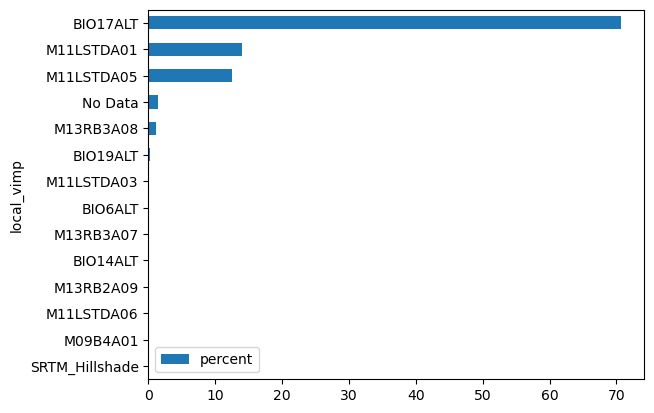

CPU times: total: 344 ms
Wall time: 348 ms


In [35]:
%%time

local_vimp_stats = grid1km_pred_shap['local_vimp'].value_counts().to_frame()
local_vimp_stats['percent'] = round( (local_vimp_stats['count'] / local_vimp_stats['count'].sum()) * 100, 2)
local_vimp_stats = local_vimp_stats.reset_index()

local_vimp_stats.to_csv('saved/data/local_vimp_raw.csv', index=False)

display(local_vimp_stats)

# Plot
local_vimp_stats.plot.barh(x='local_vimp', y='percent')
plt.gca().invert_yaxis()

plt.savefig("saved/plots/local_vimp_raw.png", dpi=300, bbox_inches= "tight")
plt.show()

### Grid1km: Set Local Predominant Variables whose count are less than 300 to "Others" because they are insignificant and thus cannot be seen on the static map. As recommendation, go interactive

,local_vimp,count,percent
0,BIO17ALT,192992,70.66
1,M11LSTDA01,38245,14.00
2,M11LSTDA05,34204,12.52
3,No Data,3827,1.40
4,M13RB3A08,2982,1.09
5,BIO19ALT,507,0.19
6,Others,353,0.13


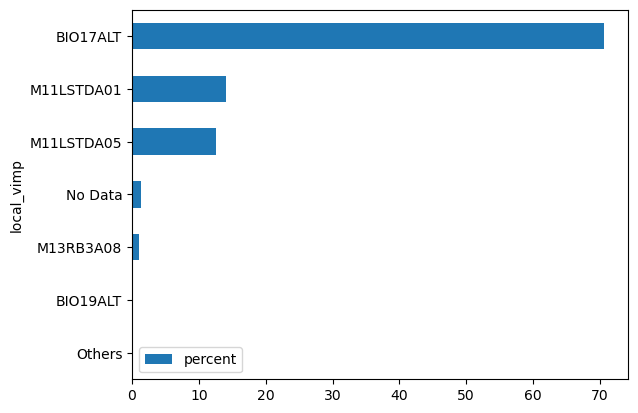

CPU times: total: 1.36 s
Wall time: 1.36 s


In [36]:
%%time

# Merge the stats columns into the main table
grid1km_pred_shap = grid1km_pred_shap.merge(local_vimp_stats, 'left', on='local_vimp')

# Query for count less than 300 and set local_vimp to 'Others'
qry = grid1km_pred_shap['count'] < 300 
grid1km_pred_shap.loc[qry, 'local_vimp'] = 'Others'

### Re-calculate the stats and review plot
local_vimp_stats = grid1km_pred_shap['local_vimp'].value_counts().to_frame()
local_vimp_stats['percent'] = round( (local_vimp_stats['count'] / local_vimp_stats['count'].sum()) * 100, 2)
local_vimp_stats = local_vimp_stats.reset_index()

local_vimp_stats.to_csv('saved/data/local_vimp_reclassified.csv', index=False)

display(local_vimp_stats)
local_vimp_stats.plot.barh(x='local_vimp', y='percent')
plt.gca().invert_yaxis()

plt.savefig("saved/plots/local_vimp_reclassified.png", dpi=300, bbox_inches= "tight")
plt.show()

### Grid1km: Define a color scheme for visualization

CPU times: total: 17 s
Wall time: 17.2 s


(182027.85899999994, 1132427.8589999997, 1014934.0814999996, 1699134.0815)

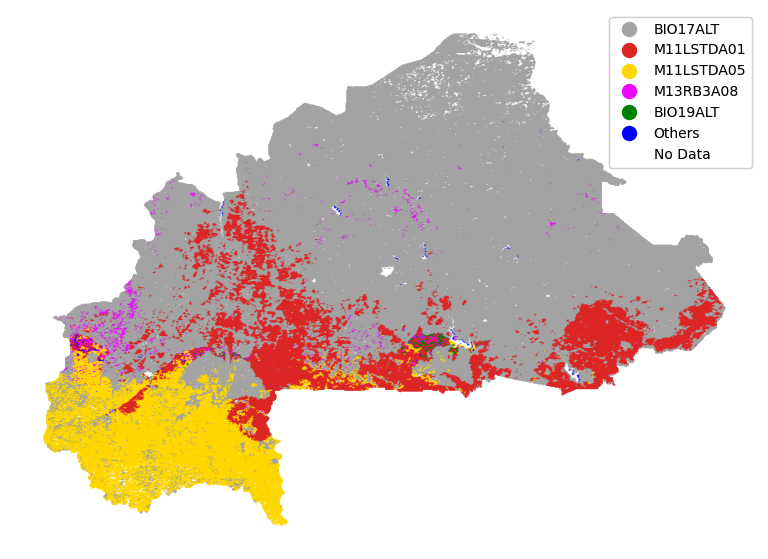

In [67]:
%%time

fig, ax = plt.subplots(figsize=(10, 7))
# fig.set_facecolor("#4b5563")

# Define custom colors
color_dict = {'BIO17ALT':  '#a3a3a3',
              'M11LSTDA01': '#dc2626',
              'M11LSTDA05': 'gold',
              'M13RB3A08': '#EC08FF', 
              'BIO19ALT': 'green',                      
              'Others' :   'blue',
              'No Data' :  'white'}

# Set color column
grid1km_pred_shap['local_vimp_color'] = grid1km_pred_shap['local_vimp'].map(color_dict)

grid1km_pred_shap.plot(legend= True, figsize= (12,10), markersize= 0.17, color= grid1km_pred_shap['local_vimp_color'], ax=ax)

# Add manual legend
# https://github.com/geopandas/geopandas/issues/2279
from matplotlib.lines import Line2D
custom_points = [Line2D([0], [0], marker="o", linestyle="none", markersize=10, color=color) for color in color_dict.values()]
leg_points = ax.legend(custom_points, color_dict.keys())
ax.add_artist(leg_points)
ax.axis('off')

plt.savefig("saved/plots/local predominant predictor map2.png", dpi=300, bbox_inches= "tight")

# Experimental Zone

Shap (%) top 10 predictors

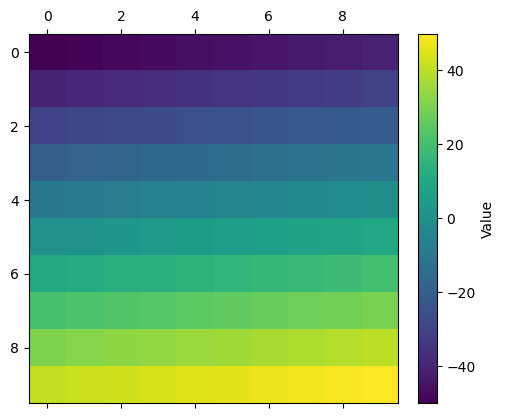

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# Create some data ranging from -50 to 50
data = np.linspace(-50, 50, 100).reshape(10, 10)

# Define a colormap
cmap = plt.get_cmap('viridis')

# Create a Normalize object that does not normalize the data
norm = mcolors.Normalize(vmin=-50, vmax=50)

# Create a ScalarMappable object
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Dummy array for ScalarMappable, can be empty

# Create a plot
fig, ax = plt.subplots()

# Display the data with the colormap, using the Normalize object
cax = ax.matshow(data, cmap=cmap, norm=norm)

# Add a colorbar with the same Normalize object to ensure it matches the plot
cbar = fig.colorbar(sm, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Value')

plt.show()


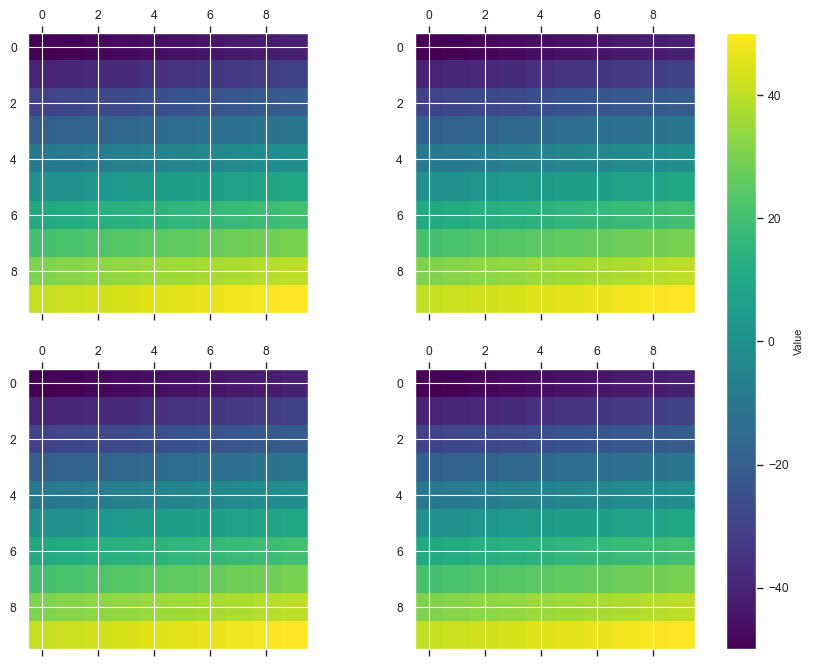

In [298]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# Create some data ranging from -50 to 50
data = np.linspace(-50, 50, 100).reshape(10, 10)

# Define a colormap
# cmap = plt.get_cmap('viridis')

# Create a Normalize object that does not normalize the data
norm = mcolors.Normalize(vmin=-50, vmax=50)

# Create a ScalarMappable object
sm = plt.cm.ScalarMappable(cmap=cmap_diverging, norm=norm)
sm.set_array([])  # Dummy array for ScalarMappable, can be empty

# Create a figure and 2x2 subplots
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(10, 8))

# Display the data with the colormap, using the Normalize object
cax1 = ax1.matshow(data, cmap=cmap, norm=norm)
cax2 = ax2.matshow(data, cmap=cmap, norm=norm)
cax3 = ax3.matshow(data, cmap=cmap, norm=norm)
cax4 = ax4.matshow(data, cmap=cmap, norm=norm)

# Add a single colorbar for all subplots using the same Normalize object
cbar = fig.colorbar(sm, ax=[ax1, ax2, ax3, ax4], fraction=0.046, pad=0.04)
cbar.set_label('Value')

# fig.subplots_adjust(wspace=0, hspace=0.2)  # Increase spacing


plt.show()